# **DS605: Fundamental of Machine Learning Project-1**  
# **Stock Price Prediction Using Regression**  

---


# Hardik Bharvada - 202418010  
# Viraj Modi - 202418060  
## Jash Virani - 202418061  
## Kashyap Shingala - 202418052

## **Problem Statement** : Predictive Modeling of Stock Prices Using Historical Data  

## **Pipeline** : Data loading -> Data preprocessing -> Split data -> Model selection -> Model training -> Model evaluation -> Model prediction

## **Pseudocode for chosen models **

1. **Import Libraries:**
   - Import necessary libraries for data manipulation, model training, evaluation, and file handling.

2. **Load the Data:**
   - Load the CSV file containing stock data.
   - Extract the filename for later use.

3. **Preprocess the Data:**
   - Convert the `Date` column to datetime format.
   - Sort the data by `Date`.
   - Define the features (`Infy_Open`, `Infy_High`, `Infy_Low`, `Infy_Volume`, `Infy_30-Day MA`, `Infy_%_Change`,`Infy_Upper Band`,`Infy_Lower Band`,`Infy_Rolling Std`) and target (`Infy_Close` shifted by -1 day).
   - Remove rows with missing values.

4. **Split the Data:**
   - Split the data into training+validation and test sets without shuffling.

5. **Initialize TimeSeriesSplit:**
   - Create a time series cross-validation splitter with 5 folds.

6. **Cross-Validation Loop:**
   - For each train-validation split:
     1. **Split the Data:**
        - Split `X_train` and `y_train` into training and validation sets.
     2. **Train the Model:**
        - Train a Ridge regression model with an alpha value of 2.0 on the training data.
     3. **Validate the Model:**
        - Predict the target values for the validation set.
        - Calculate and store evaluation metrics (MSE, MAE, RMSE, R²) for the validation set.

7. **Test the Best Model:**
   - Use the best model to predict the target values on the test set.
   - Calculate and print evaluation metrics for the test set (MSE, RMSE, MAE, R²).

8. **Visualize Predictions:**
    - Plot actual vs. predicted prices for the test set.

9. **Print Validation Metrics:**
    - Calculate and print the average evaluation metrics across all validation folds.

10. **End Program:**
    - If no model was trained, print a message.

## Data Scraping

We have scrapped the data from Yahoo Finance.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, TimeSeriesSplit, GridSearchCV
from sklearn.linear_model import Lasso,Ridge,LinearRegression,ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.exceptions import NotFittedError
import os

# Load the CSV files
infy_df = pd.read_csv(r'C:\Users\Viraj\DA-IICT\Sem-1\FML\Assignments\Regression\INFY.NS_original.csv')
tcs_df = pd.read_csv(r"C:\Users\Viraj\DA-IICT\Sem-1\FML\Assignments\Regression\TCS.NS_original.csv")
wipro_df= pd.read_csv(r"C:\Users\Viraj\DA-IICT\Sem-1\FML\Assignments\Regression\WIPRO.NS_original.csv")

# Data Analysis & Data Pre-Processing

In [16]:
'''Create DataFrame for Infosys and add 30 Day Moving Average, Percentage(%) change, 30 Day Rolling Standard deviation
and Upper and lower band in for that day'''

infy_df = infy_df.rename(columns={'Open':'Infy_Open','Close':'Infy_Close','High':'Infy_High','Low':'Infy_Low','Adj Close':'Infy_Adj Close','Volume':'Infy_Volume','30-Day MA':'Infy_30-Day MA'})

infy_df['Infy_%_Change'] = infy_df['Infy_Close'].pct_change()
infy_df['Infy_30-Day MA'] = infy_df['Infy_Close'].rolling(window=30).mean()
infy_df['Infy_Rolling Std'] = infy_df['Infy_Close'].rolling(window=30).std()

infy_df['Infy_Upper Band'] = infy_df['Infy_30-Day MA'] + (infy_df['Infy_Rolling Std'] * 2)
infy_df['Infy_Lower Band'] = infy_df['Infy_30-Day MA'] - (infy_df['Infy_Rolling Std'] * 2)

infy_df

C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\107606255.py:6: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  infy_df['Infy_%_Change'] = infy_df['Infy_Close'].pct_change()


,Date,Infy_Open,Infy_High,Infy_Low,Infy_Close,Infy_Adj Close,Infy_Volume,Infy_%_Change,Infy_30-Day MA,Infy_Rolling Std,Infy_Upper Band,Infy_Lower Band
0,2004-06-01,81.274216,83.328125,81.274216,82.617966,56.663700,28710336.0,NaN,NaN,NaN,NaN,NaN
1,2004-06-02,82.729691,83.981247,81.992966,83.398438,57.198994,17547008.0,0.009447,NaN,NaN,NaN,NaN
2,2004-06-03,83.750000,84.140625,81.500000,81.897659,56.169678,30415040.0,-0.017995,NaN,NaN,NaN,NaN
3,2004-06-04,81.250000,81.906250,80.500000,81.521095,55.911442,19523392.0,-0.004598,NaN,NaN,NaN,NaN
4,2004-06-07,82.187500,83.000000,80.501564,81.365623,55.804794,21086016.0,-0.001907,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
5003,2024-08-20,1880.000000,1885.699951,1868.199951,1872.199951,1872.199951,3870333.0,0.003968,1787.131665,72.793831,1932.719327,1641.544003
5004,2024-08-21,1875.099976,1879.000000,1867.099976,1872.699951,1872.699951,1966902.0,0.000267,1794.166663,70.407892,1934.982447,1653.350878
5005,2024-08-22,1884.000000,1893.650024,1869.699951,1880.250000,1880.250000,4300287.0,0.004032,1801.603328,67.143318,1935.889964,1667.316692
5006,2024-08-23,1878.199951,1882.599976,1857.000000,1862.099976,1862.099976,5015935.0,-0.009653,1808.731661,61.407833,1931.547327,1685.915995


In [17]:
# Handling missing values
infy_df['Infy_30-Day MA'].fillna(method='bfill',inplace=True)
infy_df['Infy_Rolling Std'].fillna(method='bfill',inplace=True)
infy_df['Infy_Upper Band'].fillna(method='bfill',inplace=True)
infy_df['Infy_Lower Band'].fillna(method='bfill',inplace=True)
infy_df

C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\4144784195.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  infy_df['Infy_30-Day MA'].fillna(method='bfill',inplace=True)
C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\4144784195.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  infy_df['Infy_30-Day MA'].fillna(method='bfill',inplace=True)
C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\4144784195.py:3: FutureWarning: A value is 

,Date,Infy_Open,Infy_High,Infy_Low,Infy_Close,Infy_Adj Close,Infy_Volume,Infy_%_Change,Infy_30-Day MA,Infy_Rolling Std,Infy_Upper Band,Infy_Lower Band
0,2004-06-01,81.274216,83.328125,81.274216,82.617966,56.663700,28710336.0,NaN,83.947344,3.121763,90.190869,77.703818
1,2004-06-02,82.729691,83.981247,81.992966,83.398438,57.198994,17547008.0,0.009447,83.947344,3.121763,90.190869,77.703818
2,2004-06-03,83.750000,84.140625,81.500000,81.897659,56.169678,30415040.0,-0.017995,83.947344,3.121763,90.190869,77.703818
3,2004-06-04,81.250000,81.906250,80.500000,81.521095,55.911442,19523392.0,-0.004598,83.947344,3.121763,90.190869,77.703818
4,2004-06-07,82.187500,83.000000,80.501564,81.365623,55.804794,21086016.0,-0.001907,83.947344,3.121763,90.190869,77.703818
...,...,...,...,...,...,...,...,...,...,...,...,...
5003,2024-08-20,1880.000000,1885.699951,1868.199951,1872.199951,1872.199951,3870333.0,0.003968,1787.131665,72.793831,1932.719327,1641.544003
5004,2024-08-21,1875.099976,1879.000000,1867.099976,1872.699951,1872.699951,1966902.0,0.000267,1794.166663,70.407892,1934.982447,1653.350878
5005,2024-08-22,1884.000000,1893.650024,1869.699951,1880.250000,1880.250000,4300287.0,0.004032,1801.603328,67.143318,1935.889964,1667.316692
5006,2024-08-23,1878.199951,1882.599976,1857.000000,1862.099976,1862.099976,5015935.0,-0.009653,1808.731661,61.407833,1931.547327,1685.915995


In [18]:
infy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5008 entries, 0 to 5007
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              5008 non-null   object 
 1   Infy_Open         5001 non-null   float64
 2   Infy_High         5001 non-null   float64
 3   Infy_Low          5001 non-null   float64
 4   Infy_Close        5001 non-null   float64
 5   Infy_Adj Close    5001 non-null   float64
 6   Infy_Volume       5001 non-null   float64
 7   Infy_%_Change     5007 non-null   float64
 8   Infy_30-Day MA    5008 non-null   float64
 9   Infy_Rolling Std  5008 non-null   float64
 10  Infy_Upper Band   5008 non-null   float64
 11  Infy_Lower Band   5008 non-null   float64
dtypes: float64(11), object(1)
memory usage: 469.6+ KB


In [19]:
'''Create DataFrame for Infosys and add 30 Day Moving Average, Percentage(%) change, 30 Day Rolling Standard deviation
and Upper and lower band in for that day'''

tcs_df = tcs_df.rename(columns={'Open':'TCS_Open','Close':'TCS_Close','High':'TCS_High','Low':'TCS_Low','Adj Close':'TCS_Adj Close','Volume':'TCS_Volume','Date':'TCS_Date','30-Day MA':'TCS_30-Day MA'})

tcs_df['TCS_%_Change'] = tcs_df['TCS_Close'].pct_change()
tcs_df['TCS_30-Day MA'] = tcs_df['TCS_Close'].rolling(window=30).mean()
tcs_df['TCS_Rolling Std'] = tcs_df['TCS_Close'].rolling(window=30).std()

tcs_df['TCS_Upper Band'] = tcs_df['TCS_30-Day MA'] + (tcs_df['TCS_Rolling Std'] * 2)
tcs_df['TCS_Lower Band'] = tcs_df['TCS_30-Day MA'] - (tcs_df['TCS_Rolling Std'] * 2)

tcs_df

C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\1097145200.py:6: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  tcs_df['TCS_%_Change'] = tcs_df['TCS_Close'].pct_change()


,TCS_Date,TCS_Open,TCS_High,TCS_Low,TCS_Close,TCS_Adj Close,TCS_Volume,TCS_%_Change,TCS_30-Day MA,TCS_Rolling Std,TCS_Upper Band,TCS_Lower Band
0,01-06-2004,82.462502,84.750000,79.387497,80.112503,56.207249,29320.0,NaN,NaN,NaN,NaN,NaN
1,02-06-2004,82.125000,82.125000,79.775002,80.000000,56.128304,4560.0,-0.001404,NaN,NaN,NaN,NaN
2,03-06-2004,82.000000,83.349998,78.300003,78.675003,55.198708,13808.0,-0.016562,NaN,NaN,NaN,NaN
3,04-06-2004,81.237503,81.250000,77.250000,78.462502,55.049606,23944.0,-0.002701,NaN,NaN,NaN,NaN
4,07-06-2004,80.000000,80.000000,78.250000,79.224998,55.584579,9608.0,0.009718,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
5004,21-08-2024,4518.000000,4560.000000,4492.549805,4551.500000,4551.500000,1896990.0,0.006234,4266.095011,154.664010,4575.423032,3956.766991
5005,22-08-2024,4560.000000,4560.950195,4497.200195,4502.000000,4502.000000,1829872.0,-0.010876,4283.311678,151.057527,4585.426733,3981.196624
5006,23-08-2024,4500.000000,4506.000000,4455.000000,4463.899902,4463.899902,1809253.0,-0.008463,4301.803345,136.973410,4575.750166,4027.856524
5007,26-08-2024,4489.000000,4552.149902,4485.000000,4502.450195,4502.450195,1844164.0,0.008636,4321.095020,121.799958,4564.694935,4077.495105


In [20]:
# Handling missing values
tcs_df['TCS_30-Day MA'].fillna(method='bfill',inplace=True)
tcs_df['TCS_Rolling Std'].fillna(method='bfill',inplace=True)
tcs_df['TCS_Upper Band'].fillna(method='bfill',inplace=True)
tcs_df['TCS_Lower Band'].fillna(method='bfill',inplace=True)
tcs_df

C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\2386329142.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  tcs_df['TCS_30-Day MA'].fillna(method='bfill',inplace=True)
C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\2386329142.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  tcs_df['TCS_30-Day MA'].fillna(method='bfill',inplace=True)
C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\2386329142.py:3: FutureWarning: A value is tryi

,TCS_Date,TCS_Open,TCS_High,TCS_Low,TCS_Close,TCS_Adj Close,TCS_Volume,TCS_%_Change,TCS_30-Day MA,TCS_Rolling Std,TCS_Upper Band,TCS_Lower Band
0,01-06-2004,82.462502,84.750000,79.387497,80.112503,56.207249,29320.0,NaN,85.594167,4.129974,93.854116,77.334218
1,02-06-2004,82.125000,82.125000,79.775002,80.000000,56.128304,4560.0,-0.001404,85.594167,4.129974,93.854116,77.334218
2,03-06-2004,82.000000,83.349998,78.300003,78.675003,55.198708,13808.0,-0.016562,85.594167,4.129974,93.854116,77.334218
3,04-06-2004,81.237503,81.250000,77.250000,78.462502,55.049606,23944.0,-0.002701,85.594167,4.129974,93.854116,77.334218
4,07-06-2004,80.000000,80.000000,78.250000,79.224998,55.584579,9608.0,0.009718,85.594167,4.129974,93.854116,77.334218
...,...,...,...,...,...,...,...,...,...,...,...,...
5004,21-08-2024,4518.000000,4560.000000,4492.549805,4551.500000,4551.500000,1896990.0,0.006234,4266.095011,154.664010,4575.423032,3956.766991
5005,22-08-2024,4560.000000,4560.950195,4497.200195,4502.000000,4502.000000,1829872.0,-0.010876,4283.311678,151.057527,4585.426733,3981.196624
5006,23-08-2024,4500.000000,4506.000000,4455.000000,4463.899902,4463.899902,1809253.0,-0.008463,4301.803345,136.973410,4575.750166,4027.856524
5007,26-08-2024,4489.000000,4552.149902,4485.000000,4502.450195,4502.450195,1844164.0,0.008636,4321.095020,121.799958,4564.694935,4077.495105


In [21]:
tcs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5009 entries, 0 to 5008
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   TCS_Date         5009 non-null   object 
 1   TCS_Open         5001 non-null   float64
 2   TCS_High         5001 non-null   float64
 3   TCS_Low          5001 non-null   float64
 4   TCS_Close        5001 non-null   float64
 5   TCS_Adj Close    5001 non-null   float64
 6   TCS_Volume       5001 non-null   float64
 7   TCS_%_Change     5008 non-null   float64
 8   TCS_30-Day MA    5009 non-null   float64
 9   TCS_Rolling Std  5009 non-null   float64
 10  TCS_Upper Band   5009 non-null   float64
 11  TCS_Lower Band   5009 non-null   float64
dtypes: float64(11), object(1)
memory usage: 469.7+ KB


In [22]:
'''Create DataFrame for Infosys and add 30 Day Moving Average, Percentage(%) change, 30 Day Rolling Standard deviation
and Upper and lower band in for that day'''

wipro_df = wipro_df.rename(columns={'Open':'Wipro_Open','Close':'Wipro_Close','High':'Wipro_High','Low':'Wipro_Low','Adj Close':'Wipro_Adj Close','Volume':'Wipro_Volume','Date':'Wipro_Date','30-Day MA':'Wipro_30-Day MA'})

wipro_df['Wipro_%_Change'] = wipro_df['Wipro_Close'].pct_change()
wipro_df['Wipro_30-Day MA'] = wipro_df['Wipro_Close'].rolling(window=30).mean()
wipro_df['Wipro_Rolling Std'] = wipro_df['Wipro_Close'].rolling(window=30).std()

wipro_df['Wipro_Upper Band'] = wipro_df['Wipro_30-Day MA'] + (wipro_df['Wipro_Rolling Std'] * 2)
wipro_df['Wipro_Lower Band'] = wipro_df['Wipro_30-Day MA'] - (wipro_df['Wipro_Rolling Std'] * 2)

wipro_df

C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\1815419049.py:6: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  wipro_df['Wipro_%_Change'] = wipro_df['Wipro_Close'].pct_change()


,Wipro_Date,Wipro_Open,Wipro_High,Wipro_Low,Wipro_Close,Wipro_Adj Close,Wipro_Volume,Wipro_%_Change,Wipro_30-Day MA,Wipro_Rolling Std,Wipro_Upper Band,Wipro_Lower Band
0,2004-06-01,57.811878,58.676250,56.930626,57.245628,47.559456,9873999.0,NaN,NaN,NaN,NaN,NaN
1,2004-06-02,57.000004,57.693752,56.287502,57.345001,47.642014,8518239.0,0.001736,NaN,NaN,NaN,NaN
2,2004-06-03,58.125004,58.205627,54.078751,54.740627,45.478317,12914319.0,-0.045416,NaN,NaN,NaN,NaN
3,2004-06-04,54.941254,56.775002,54.011253,56.431877,46.883396,11777652.0,0.030896,NaN,NaN,NaN,NaN
4,2004-06-07,59.025002,59.025002,54.943127,55.706253,46.280548,9264906.0,-0.012858,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
5003,2024-08-20,519.900024,527.599976,519.650024,524.650024,524.650024,4771906.0,0.009428,519.245000,25.495913,570.236826,468.253174
5004,2024-08-21,523.400024,528.099976,521.049988,526.349976,526.349976,3227201.0,0.003240,518.749999,25.197368,569.144735,468.355263
5005,2024-08-22,527.799988,530.549988,518.049988,519.000000,519.000000,5748253.0,-0.013964,518.016666,24.845162,567.706989,468.326342
5006,2024-08-23,519.900024,521.450012,511.350006,512.400024,512.400024,5638853.0,-0.012717,517.245000,24.640481,566.525961,467.964039


In [23]:
# Handling missing values
wipro_df['Wipro_30-Day MA'].fillna(method='bfill',inplace=True)
wipro_df['Wipro_Rolling Std'].fillna(method='bfill',inplace=True)
wipro_df['Wipro_Upper Band'].fillna(method='bfill',inplace=True)
wipro_df['Wipro_Lower Band'].fillna(method='bfill',inplace=True)
wipro_df

C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\3191371958.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  wipro_df['Wipro_30-Day MA'].fillna(method='bfill',inplace=True)
C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\3191371958.py:2: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  wipro_df['Wipro_30-Day MA'].fillna(method='bfill',inplace=True)
C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\3191371958.py:3: FutureWarning: A value

,Wipro_Date,Wipro_Open,Wipro_High,Wipro_Low,Wipro_Close,Wipro_Adj Close,Wipro_Volume,Wipro_%_Change,Wipro_30-Day MA,Wipro_Rolling Std,Wipro_Upper Band,Wipro_Lower Band
0,2004-06-01,57.811878,58.676250,56.930626,57.245628,47.559456,9873999.0,NaN,57.591940,2.030103,61.652146,53.531733
1,2004-06-02,57.000004,57.693752,56.287502,57.345001,47.642014,8518239.0,0.001736,57.591940,2.030103,61.652146,53.531733
2,2004-06-03,58.125004,58.205627,54.078751,54.740627,45.478317,12914319.0,-0.045416,57.591940,2.030103,61.652146,53.531733
3,2004-06-04,54.941254,56.775002,54.011253,56.431877,46.883396,11777652.0,0.030896,57.591940,2.030103,61.652146,53.531733
4,2004-06-07,59.025002,59.025002,54.943127,55.706253,46.280548,9264906.0,-0.012858,57.591940,2.030103,61.652146,53.531733
...,...,...,...,...,...,...,...,...,...,...,...,...
5003,2024-08-20,519.900024,527.599976,519.650024,524.650024,524.650024,4771906.0,0.009428,519.245000,25.495913,570.236826,468.253174
5004,2024-08-21,523.400024,528.099976,521.049988,526.349976,526.349976,3227201.0,0.003240,518.749999,25.197368,569.144735,468.355263
5005,2024-08-22,527.799988,530.549988,518.049988,519.000000,519.000000,5748253.0,-0.013964,518.016666,24.845162,567.706989,468.326342
5006,2024-08-23,519.900024,521.450012,511.350006,512.400024,512.400024,5638853.0,-0.012717,517.245000,24.640481,566.525961,467.964039


In [24]:
wipro_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5008 entries, 0 to 5007
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Wipro_Date         5008 non-null   object 
 1   Wipro_Open         5001 non-null   float64
 2   Wipro_High         5001 non-null   float64
 3   Wipro_Low          5001 non-null   float64
 4   Wipro_Close        5001 non-null   float64
 5   Wipro_Adj Close    5001 non-null   float64
 6   Wipro_Volume       5001 non-null   float64
 7   Wipro_%_Change     5007 non-null   float64
 8   Wipro_30-Day MA    5008 non-null   float64
 9   Wipro_Rolling Std  5008 non-null   float64
 10  Wipro_Upper Band   5008 non-null   float64
 11  Wipro_Lower Band   5008 non-null   float64
dtypes: float64(11), object(1)
memory usage: 469.6+ KB


In [25]:
# Create Final DataFrame
final_df = pd.concat([infy_df,tcs_df,wipro_df],axis=1)
final_df

,Date,Infy_Open,Infy_High,Infy_Low,Infy_Close,Infy_Adj Close,Infy_Volume,Infy_%_Change,Infy_30-Day MA,Infy_Rolling Std,...,Wipro_High,Wipro_Low,Wipro_Close,Wipro_Adj Close,Wipro_Volume,Wipro_%_Change,Wipro_30-Day MA,Wipro_Rolling Std,Wipro_Upper Band,Wipro_Lower Band
0,2004-06-01,81.274216,83.328125,81.274216,82.617966,56.663700,28710336.0,NaN,83.947344,3.121763,...,58.676250,56.930626,57.245628,47.559456,9873999.0,NaN,57.591940,2.030103,61.652146,53.531733
1,2004-06-02,82.729691,83.981247,81.992966,83.398438,57.198994,17547008.0,0.009447,83.947344,3.121763,...,57.693752,56.287502,57.345001,47.642014,8518239.0,0.001736,57.591940,2.030103,61.652146,53.531733
2,2004-06-03,83.750000,84.140625,81.500000,81.897659,56.169678,30415040.0,-0.017995,83.947344,3.121763,...,58.205627,54.078751,54.740627,45.478317,12914319.0,-0.045416,57.591940,2.030103,61.652146,53.531733
3,2004-06-04,81.250000,81.906250,80.500000,81.521095,55.911442,19523392.0,-0.004598,83.947344,3.121763,...,56.775002,54.011253,56.431877,46.883396,11777652.0,0.030896,57.591940,2.030103,61.652146,53.531733
4,2004-06-07,82.187500,83.000000,80.501564,81.365623,55.804794,21086016.0,-0.001907,83.947344,3.121763,...,59.025002,54.943127,55.706253,46.280548,9264906.0,-0.012858,57.591940,2.030103,61.652146,53.531733
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5004,2024-08-21,1875.099976,1879.000000,1867.099976,1872.699951,1872.699951,1966902.0,0.000267,1794.166663,70.407892,...,528.099976,521.049988,526.349976,526.349976,3227201.0,0.003240,518.749999,25.197368,569.144735,468.355263
5005,2024-08-22,1884.000000,1893.650024,1869.699951,1880.250000,1880.250000,4300287.0,0.004032,1801.603328,67.143318,...,530.549988,518.049988,519.000000,519.000000,5748253.0,-0.013964,518.016666,24.845162,567.706989,468.326342
5006,2024-08-23,1878.199951,1882.599976,1857.000000,1862.099976,1862.099976,5015935.0,-0.009653,1808.731661,61.407833,...,521.450012,511.350006,512.400024,512.400024,5638853.0,-0.012717,517.245000,24.640481,566.525961,467.964039
5007,2024-08-26,1870.000000,1888.750000,1864.000000,1876.150024,1876.150024,3728589.0,0.007545,1816.179997,55.052247,...,524.799988,515.950012,520.000000,520.000000,8675690.0,0.014832,516.775001,24.441569,565.658138,467.891864


In [26]:
# Removing duplicate columns from Final DataFrame
final_df.drop(columns=['TCS_Date','Wipro_Date'],inplace=True)
final_df

,Date,Infy_Open,Infy_High,Infy_Low,Infy_Close,Infy_Adj Close,Infy_Volume,Infy_%_Change,Infy_30-Day MA,Infy_Rolling Std,...,Wipro_High,Wipro_Low,Wipro_Close,Wipro_Adj Close,Wipro_Volume,Wipro_%_Change,Wipro_30-Day MA,Wipro_Rolling Std,Wipro_Upper Band,Wipro_Lower Band
0,2004-06-01,81.274216,83.328125,81.274216,82.617966,56.663700,28710336.0,NaN,83.947344,3.121763,...,58.676250,56.930626,57.245628,47.559456,9873999.0,NaN,57.591940,2.030103,61.652146,53.531733
1,2004-06-02,82.729691,83.981247,81.992966,83.398438,57.198994,17547008.0,0.009447,83.947344,3.121763,...,57.693752,56.287502,57.345001,47.642014,8518239.0,0.001736,57.591940,2.030103,61.652146,53.531733
2,2004-06-03,83.750000,84.140625,81.500000,81.897659,56.169678,30415040.0,-0.017995,83.947344,3.121763,...,58.205627,54.078751,54.740627,45.478317,12914319.0,-0.045416,57.591940,2.030103,61.652146,53.531733
3,2004-06-04,81.250000,81.906250,80.500000,81.521095,55.911442,19523392.0,-0.004598,83.947344,3.121763,...,56.775002,54.011253,56.431877,46.883396,11777652.0,0.030896,57.591940,2.030103,61.652146,53.531733
4,2004-06-07,82.187500,83.000000,80.501564,81.365623,55.804794,21086016.0,-0.001907,83.947344,3.121763,...,59.025002,54.943127,55.706253,46.280548,9264906.0,-0.012858,57.591940,2.030103,61.652146,53.531733
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5004,2024-08-21,1875.099976,1879.000000,1867.099976,1872.699951,1872.699951,1966902.0,0.000267,1794.166663,70.407892,...,528.099976,521.049988,526.349976,526.349976,3227201.0,0.003240,518.749999,25.197368,569.144735,468.355263
5005,2024-08-22,1884.000000,1893.650024,1869.699951,1880.250000,1880.250000,4300287.0,0.004032,1801.603328,67.143318,...,530.549988,518.049988,519.000000,519.000000,5748253.0,-0.013964,518.016666,24.845162,567.706989,468.326342
5006,2024-08-23,1878.199951,1882.599976,1857.000000,1862.099976,1862.099976,5015935.0,-0.009653,1808.731661,61.407833,...,521.450012,511.350006,512.400024,512.400024,5638853.0,-0.012717,517.245000,24.640481,566.525961,467.964039
5007,2024-08-26,1870.000000,1888.750000,1864.000000,1876.150024,1876.150024,3728589.0,0.007545,1816.179997,55.052247,...,524.799988,515.950012,520.000000,520.000000,8675690.0,0.014832,516.775001,24.441569,565.658138,467.891864


In [27]:
# List of all columns in Final DataFrame
final_df.columns.tolist()

['Date',
 'Infy_Open',
 'Infy_High',
 'Infy_Low',
 'Infy_Close',
 'Infy_Adj Close',
 'Infy_Volume',
 'Infy_%_Change',
 'Infy_30-Day MA',
 'Infy_Rolling Std',
 'Infy_Upper Band',
 'Infy_Lower Band',
 'TCS_Open',
 'TCS_High',
 'TCS_Low',
 'TCS_Close',
 'TCS_Adj Close',
 'TCS_Volume',
 'TCS_%_Change',
 'TCS_30-Day MA',
 'TCS_Rolling Std',
 'TCS_Upper Band',
 'TCS_Lower Band',
 'Wipro_Open',
 'Wipro_High',
 'Wipro_Low',
 'Wipro_Close',
 'Wipro_Adj Close',
 'Wipro_Volume',
 'Wipro_%_Change',
 'Wipro_30-Day MA',
 'Wipro_Rolling Std',
 'Wipro_Upper Band',
 'Wipro_Lower Band']

In [28]:
# Checking Null Values
final_df.isnull().sum()

Date                 1
Infy_Open            8
Infy_High            8
Infy_Low             8
Infy_Close           8
Infy_Adj Close       8
Infy_Volume          8
Infy_%_Change        2
Infy_30-Day MA       1
Infy_Rolling Std     1
Infy_Upper Band      1
Infy_Lower Band      1
TCS_Open             8
TCS_High             8
TCS_Low              8
TCS_Close            8
TCS_Adj Close        8
TCS_Volume           8
TCS_%_Change         1
TCS_30-Day MA        0
TCS_Rolling Std      0
TCS_Upper Band       0
TCS_Lower Band       0
Wipro_Open           8
Wipro_High           8
Wipro_Low            8
Wipro_Close          8
Wipro_Adj Close      8
Wipro_Volume         8
Wipro_%_Change       2
Wipro_30-Day MA      1
Wipro_Rolling Std    1
Wipro_Upper Band     1
Wipro_Lower Band     1
dtype: int64

In [29]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5009 entries, 0 to 5008
Data columns (total 34 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Date               5008 non-null   object 
 1   Infy_Open          5001 non-null   float64
 2   Infy_High          5001 non-null   float64
 3   Infy_Low           5001 non-null   float64
 4   Infy_Close         5001 non-null   float64
 5   Infy_Adj Close     5001 non-null   float64
 6   Infy_Volume        5001 non-null   float64
 7   Infy_%_Change      5007 non-null   float64
 8   Infy_30-Day MA     5008 non-null   float64
 9   Infy_Rolling Std   5008 non-null   float64
 10  Infy_Upper Band    5008 non-null   float64
 11  Infy_Lower Band    5008 non-null   float64
 12  TCS_Open           5001 non-null   float64
 13  TCS_High           5001 non-null   float64
 14  TCS_Low            5001 non-null   float64
 15  TCS_Close          5001 non-null   float64
 16  TCS_Adj Close      5001 

In [30]:
# Create Final DataFrame after all Data Cleaning and processing
final_df.fillna(method='ffill',inplace=True)
final_df

C:\Users\Viraj\AppData\Local\Temp\ipykernel_13216\1156473107.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  final_df.fillna(method='ffill',inplace=True)


,Date,Infy_Open,Infy_High,Infy_Low,Infy_Close,Infy_Adj Close,Infy_Volume,Infy_%_Change,Infy_30-Day MA,Infy_Rolling Std,...,Wipro_High,Wipro_Low,Wipro_Close,Wipro_Adj Close,Wipro_Volume,Wipro_%_Change,Wipro_30-Day MA,Wipro_Rolling Std,Wipro_Upper Band,Wipro_Lower Band
0,2004-06-01,81.274216,83.328125,81.274216,82.617966,56.663700,28710336.0,NaN,83.947344,3.121763,...,58.676250,56.930626,57.245628,47.559456,9873999.0,NaN,57.591940,2.030103,61.652146,53.531733
1,2004-06-02,82.729691,83.981247,81.992966,83.398438,57.198994,17547008.0,0.009447,83.947344,3.121763,...,57.693752,56.287502,57.345001,47.642014,8518239.0,0.001736,57.591940,2.030103,61.652146,53.531733
2,2004-06-03,83.750000,84.140625,81.500000,81.897659,56.169678,30415040.0,-0.017995,83.947344,3.121763,...,58.205627,54.078751,54.740627,45.478317,12914319.0,-0.045416,57.591940,2.030103,61.652146,53.531733
3,2004-06-04,81.250000,81.906250,80.500000,81.521095,55.911442,19523392.0,-0.004598,83.947344,3.121763,...,56.775002,54.011253,56.431877,46.883396,11777652.0,0.030896,57.591940,2.030103,61.652146,53.531733
4,2004-06-07,82.187500,83.000000,80.501564,81.365623,55.804794,21086016.0,-0.001907,83.947344,3.121763,...,59.025002,54.943127,55.706253,46.280548,9264906.0,-0.012858,57.591940,2.030103,61.652146,53.531733
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5004,2024-08-21,1875.099976,1879.000000,1867.099976,1872.699951,1872.699951,1966902.0,0.000267,1794.166663,70.407892,...,528.099976,521.049988,526.349976,526.349976,3227201.0,0.003240,518.749999,25.197368,569.144735,468.355263
5005,2024-08-22,1884.000000,1893.650024,1869.699951,1880.250000,1880.250000,4300287.0,0.004032,1801.603328,67.143318,...,530.549988,518.049988,519.000000,519.000000,5748253.0,-0.013964,518.016666,24.845162,567.706989,468.326342
5006,2024-08-23,1878.199951,1882.599976,1857.000000,1862.099976,1862.099976,5015935.0,-0.009653,1808.731661,61.407833,...,521.450012,511.350006,512.400024,512.400024,5638853.0,-0.012717,517.245000,24.640481,566.525961,467.964039
5007,2024-08-26,1870.000000,1888.750000,1864.000000,1876.150024,1876.150024,3728589.0,0.007545,1816.179997,55.052247,...,524.799988,515.950012,520.000000,520.000000,8675690.0,0.014832,516.775001,24.441569,565.658138,467.891864


In [31]:
final_df.isnull().sum()

Date                 0
Infy_Open            0
Infy_High            0
Infy_Low             0
Infy_Close           0
Infy_Adj Close       0
Infy_Volume          0
Infy_%_Change        1
Infy_30-Day MA       0
Infy_Rolling Std     0
Infy_Upper Band      0
Infy_Lower Band      0
TCS_Open             0
TCS_High             0
TCS_Low              0
TCS_Close            0
TCS_Adj Close        0
TCS_Volume           0
TCS_%_Change         1
TCS_30-Day MA        0
TCS_Rolling Std      0
TCS_Upper Band       0
TCS_Lower Band       0
Wipro_Open           0
Wipro_High           0
Wipro_Low            0
Wipro_Close          0
Wipro_Adj Close      0
Wipro_Volume         0
Wipro_%_Change       1
Wipro_30-Day MA      0
Wipro_Rolling Std    0
Wipro_Upper Band     0
Wipro_Lower Band     0
dtype: int64

In [34]:
# Changing format of date
final_df['Date'] = pd.to_datetime(final_df['Date'], format='%d-%m-%Y')

In [35]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5009 entries, 0 to 5008
Data columns (total 34 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               5009 non-null   datetime64[ns]
 1   Infy_Open          5009 non-null   float64       
 2   Infy_High          5009 non-null   float64       
 3   Infy_Low           5009 non-null   float64       
 4   Infy_Close         5009 non-null   float64       
 5   Infy_Adj Close     5009 non-null   float64       
 6   Infy_Volume        5009 non-null   float64       
 7   Infy_%_Change      5008 non-null   float64       
 8   Infy_30-Day MA     5009 non-null   float64       
 9   Infy_Rolling Std   5009 non-null   float64       
 10  Infy_Upper Band    5009 non-null   float64       
 11  Infy_Lower Band    5009 non-null   float64       
 12  TCS_Open           5009 non-null   float64       
 13  TCS_High           5009 non-null   float64       
 14  TCS_Low 

In [36]:
# Changing type of variable so save memory
final_df['Infy_Open'] = final_df['Infy_Open'].astype(np.float32)
final_df['Infy_High'] = final_df['Infy_High'].astype(np.float32)
final_df['Infy_Low'] = final_df['Infy_Low'].astype(np.float32)
final_df['Infy_Close'] = final_df['Infy_Close'].astype(np.float32)
final_df['Infy_Adj Close'] = final_df['Infy_Adj Close'].astype(np.float32)
final_df['Infy_Volume'] = final_df['Infy_Volume'].astype(np.int32)
final_df['Infy_30-Day MA'] = final_df['Infy_30-Day MA'].astype(np.float32)
final_df['Infy_%_Change'] = final_df['Infy_%_Change'].astype(np.float32)
final_df['Infy_Rolling Std'] = final_df['Infy_Rolling Std'].astype(np.float32)
final_df['Infy_Upper Band'] = final_df['Infy_Upper Band'].astype(np.float32)
final_df['Infy_Lower Band'] = final_df['Infy_Lower Band'].astype(np.float32)


final_df['TCS_Open'] = final_df['TCS_Open'].astype(np.float32)
final_df['TCS_High'] = final_df['TCS_High'].astype(np.float32)
final_df['TCS_Low'] = final_df['TCS_Low'].astype(np.float32)
final_df['TCS_Close'] = final_df['TCS_Close'].astype(np.float32)
final_df['TCS_Adj Close'] = final_df['TCS_Adj Close'].astype(np.float32)
final_df['TCS_Volume'] = final_df['TCS_Volume'].astype(np.int32)
final_df['TCS_30-Day MA'] = final_df['TCS_30-Day MA'].astype(np.float32)
final_df['TCS_%_Change'] = final_df['TCS_%_Change'].astype(np.float32)
final_df['TCS_Rolling Std'] = final_df['TCS_Rolling Std'].astype(np.float32)
final_df['TCS_Upper Band'] = final_df['TCS_Upper Band'].astype(np.float32)
final_df['TCS_Lower Band'] = final_df['TCS_Lower Band'].astype(np.float32)


final_df['Wipro_Open'] = final_df['Wipro_Open'].astype(np.float32)
final_df['Wipro_High'] = final_df['Wipro_High'].astype(np.float32)
final_df['Wipro_Low'] = final_df['Wipro_Low'].astype(np.float32)
final_df['Wipro_Close'] = final_df['Wipro_Close'].astype(np.float32)
final_df['Wipro_Adj Close'] = final_df['Wipro_Adj Close'].astype(np.float32)
final_df['Wipro_Volume'] = final_df['Wipro_Volume'].astype(np.int32)
final_df['Wipro_30-Day MA'] = final_df['Wipro_30-Day MA'].astype(np.float32)
final_df['Wipro_%_Change'] = final_df['Wipro_%_Change'].astype(np.float32)
final_df['Wipro_Rolling Std'] = final_df['Wipro_Rolling Std'].astype(np.float32)
final_df['Wipro_Upper Band'] = final_df['Wipro_Upper Band'].astype(np.float32)
final_df['Wipro_Lower Band'] = final_df['Wipro_Lower Band'].astype(np.float32)

In [37]:
final_df.info() #Memory is reduced by almost 50%

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5009 entries, 0 to 5008
Data columns (total 34 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               5009 non-null   datetime64[ns]
 1   Infy_Open          5009 non-null   float32       
 2   Infy_High          5009 non-null   float32       
 3   Infy_Low           5009 non-null   float32       
 4   Infy_Close         5009 non-null   float32       
 5   Infy_Adj Close     5009 non-null   float32       
 6   Infy_Volume        5009 non-null   int32         
 7   Infy_%_Change      5008 non-null   float32       
 8   Infy_30-Day MA     5009 non-null   float32       
 9   Infy_Rolling Std   5009 non-null   float32       
 10  Infy_Upper Band    5009 non-null   float32       
 11  Infy_Lower Band    5009 non-null   float32       
 12  TCS_Open           5009 non-null   float32       
 13  TCS_High           5009 non-null   float32       
 14  TCS_Low 

In [38]:
final_df.duplicated().sum()

0

In [39]:
# Final DataFrame
final_df

,Date,Infy_Open,Infy_High,Infy_Low,Infy_Close,Infy_Adj Close,Infy_Volume,Infy_%_Change,Infy_30-Day MA,Infy_Rolling Std,...,Wipro_High,Wipro_Low,Wipro_Close,Wipro_Adj Close,Wipro_Volume,Wipro_%_Change,Wipro_30-Day MA,Wipro_Rolling Std,Wipro_Upper Band,Wipro_Lower Band
0,2004-06-01,81.274216,83.328125,81.274216,82.617966,56.663700,28710336,NaN,83.947342,3.121763,...,58.676250,56.930626,57.245628,47.559456,9873999,NaN,57.591938,2.030103,61.652145,53.531734
1,2004-06-02,82.729691,83.981247,81.992966,83.398438,57.198994,17547008,0.009447,83.947342,3.121763,...,57.693752,56.287502,57.345001,47.642014,8518239,0.001736,57.591938,2.030103,61.652145,53.531734
2,2004-06-03,83.750000,84.140625,81.500000,81.897659,56.169678,30415040,-0.017995,83.947342,3.121763,...,58.205627,54.078751,54.740627,45.478317,12914319,-0.045416,57.591938,2.030103,61.652145,53.531734
3,2004-06-04,81.250000,81.906250,80.500000,81.521095,55.911442,19523392,-0.004598,83.947342,3.121763,...,56.775002,54.011253,56.431877,46.883396,11777652,0.030896,57.591938,2.030103,61.652145,53.531734
4,2004-06-07,82.187500,83.000000,80.501564,81.365623,55.804794,21086016,-0.001907,83.947342,3.121763,...,59.025002,54.943127,55.706253,46.280548,9264906,-0.012858,57.591938,2.030103,61.652145,53.531734
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5004,2024-08-21,1875.099976,1879.000000,1867.099976,1872.699951,1872.699951,1966902,0.000267,1794.166626,70.407890,...,528.099976,521.049988,526.349976,526.349976,3227201,0.003240,518.750000,25.197369,569.144714,468.355255
5005,2024-08-22,1884.000000,1893.650024,1869.699951,1880.250000,1880.250000,4300287,0.004032,1801.603271,67.143318,...,530.549988,518.049988,519.000000,519.000000,5748253,-0.013964,518.016663,24.845161,567.706970,468.326355
5006,2024-08-23,1878.199951,1882.599976,1857.000000,1862.099976,1862.099976,5015935,-0.009653,1808.731689,61.407833,...,521.450012,511.350006,512.400024,512.400024,5638853,-0.012717,517.244995,24.640480,566.525940,467.964050
5007,2024-08-26,1870.000000,1888.750000,1864.000000,1876.150024,1876.150024,3728589,0.007545,1816.180054,55.052246,...,524.799988,515.950012,520.000000,520.000000,8675690,0.014832,516.775024,24.441568,565.658142,467.891876


In [40]:
final_df.to_csv('final_df.csv')

## Understanding the data through effective graph visualization


### Closing price plot of all companies.

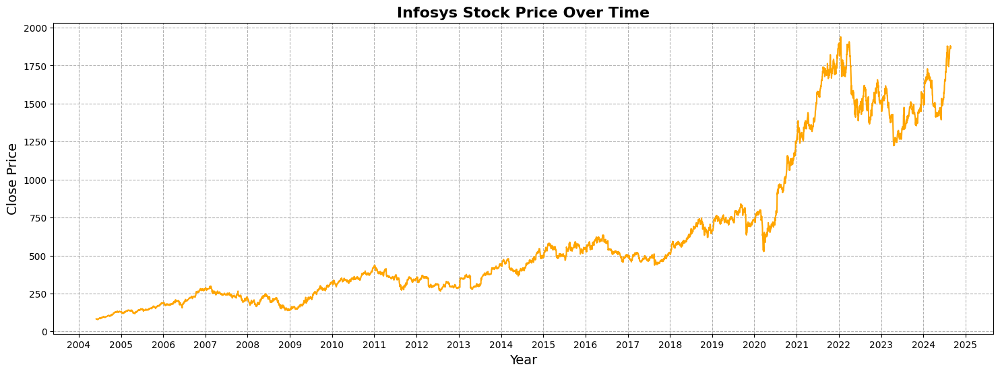

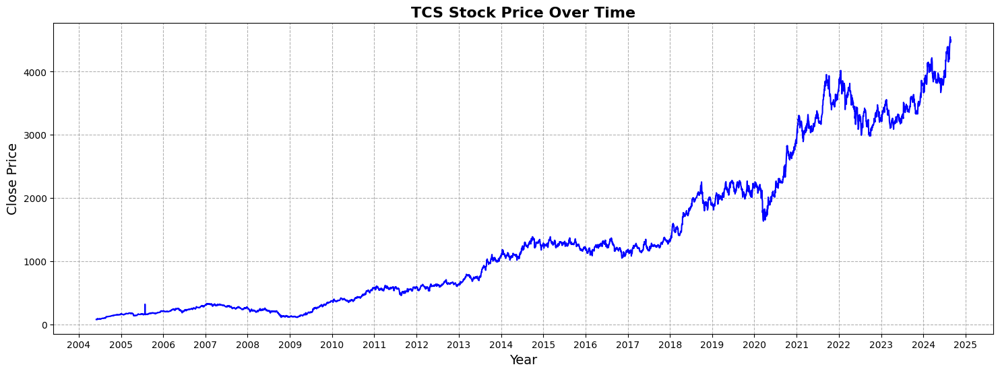

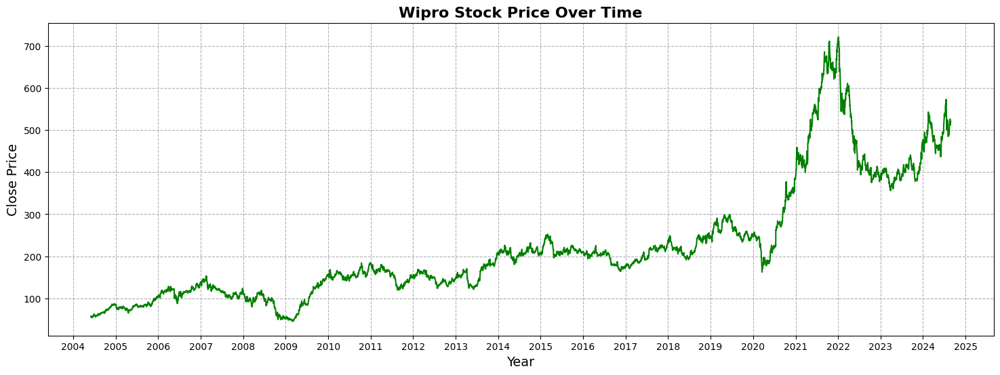

In [41]:
# Graph of Closing Price of all 3 companies
import matplotlib.dates as mdates
close_prices = [['Infy_Close','orange','Infosys'],['TCS_Close','blue','TCS'],['Wipro_Close','green','Wipro']]

for i,j,k in close_prices:
  plt.figure(figsize=(18, 6))
  plt.plot(final_df['Date'],final_df[i],color=j)

  plt.title(f'{k} Stock Price Over Time', fontsize=16, fontweight='bold')
  plt.xlabel('Year', fontsize=14)
  plt.ylabel('Close Price', fontsize=14)

  plt.gca().xaxis.set_major_locator(mdates.YearLocator())
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

  plt.grid(True, which='both', linestyle='--')

### INSIGHTS
1. Relative Performance: Compare how each stock's price has changed relative to the others. This can reveal which stock has performed better over the long term.  
2. Volatility: Assess the volatility of each stock by looking at the fluctuations in their prices. A stock with more frequent and larger fluctuations may be more volatile.  
3. Impact of Major Events Analysis: Correlate significant changes in the stock prices with major historical events (e.g., the 2008 Lehman Brothers financial crisis, COVID-19). This can help understand how these events impacted each stock differently.
4. Stock Specific Analysis:

*   TCS have shown a steady upward trend with fewer dips, that shows strong and consistent performance.
*   Infosys have experienced more volatility, with significant spikes and drops but overall trend is upwards.
*   Wipro have had periods of stagnation beacuse of gaining and losing value, and has shown most voliaility.



### Closing price of all 3 Companies together.

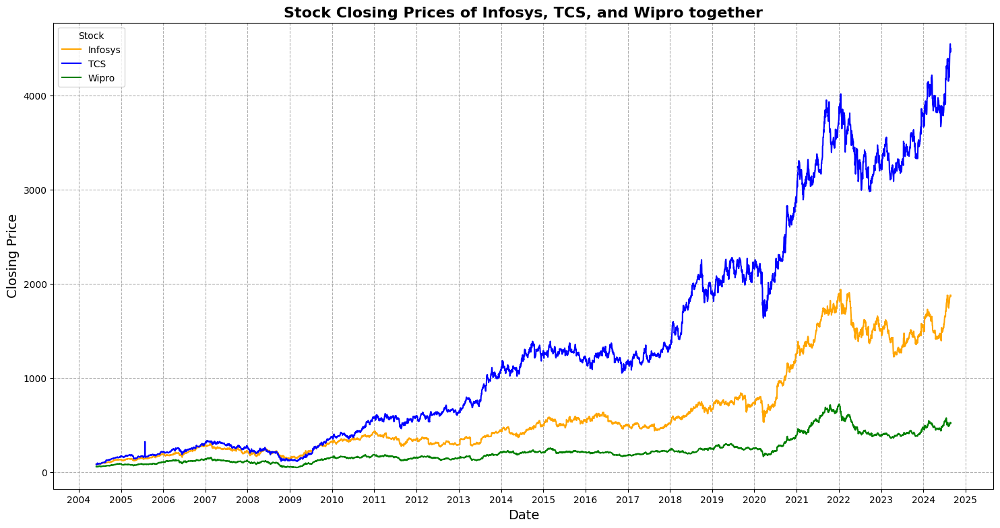

In [42]:
# Graph of Closing Price of all 3 companies together
stocks = [
    ('Infy_Close', 'orange', 'Infosys'),
    ('TCS_Close', 'blue', 'TCS'),
    ('Wipro_Close', 'green', 'Wipro')
]

plt.figure(figsize=(18,9))

for i, j, k in stocks:
    plt.plot(final_df['Date'], final_df[i], color=j, label=k)

plt.title('Stock Closing Prices of Infosys, TCS, and Wipro together', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Closing Price', fontsize=14)
plt.legend(title='Stock')
plt.grid(True, which='both', linestyle='--')

# Set x-axis major locator to year and format the labels
plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.show()

### INSIGHTS
 Here we can obverse that though starting from almost the price in June 2004 stock price of TCS has has grown extensively in comparision to Infosys and Wipro, though Infosys outperformed Wipro but still has lagged far behind TCS in terms of stock price.

### Cumulative percenatge gain of all 3 companies together.

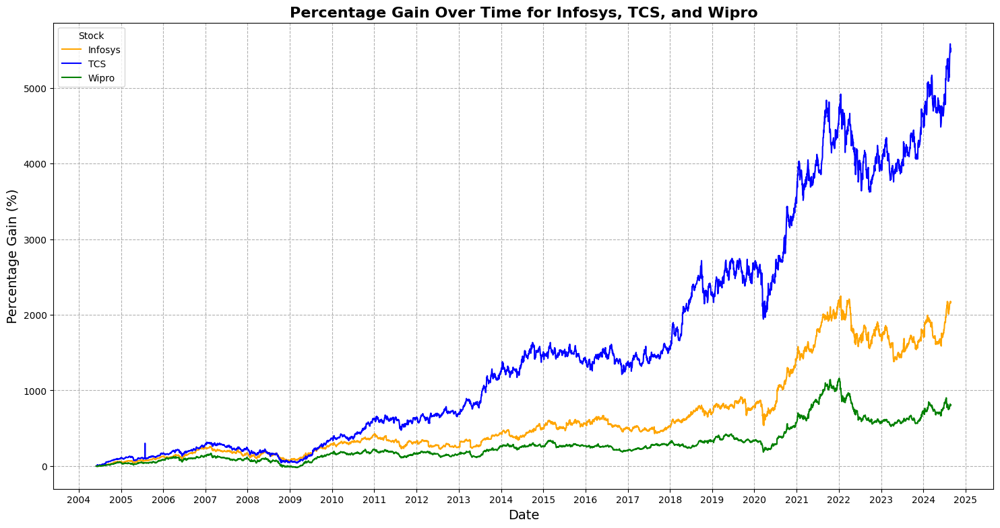

In [43]:
# Graph of Cumulative percenatge gain of all 3 companies together over the years
stocks_gains = [
    ('Infy_Close', 'orange', 'Infosys'),
    ('TCS_Close', 'blue', 'TCS'),
    ('Wipro_Close', 'green', 'Wipro')
]

plt.figure(figsize=(18, 9))

for i, j, k in stocks_gains:

    initial_price = final_df[i].iloc[0]
    percentage_change = ((final_df[i] - initial_price) / initial_price) * 100
    plt.plot(final_df['Date'], percentage_change, color=j, label=k)

plt.title('Percentage Gain Over Time for Infosys, TCS, and Wipro', fontsize=16, fontweight='bold')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Percentage Gain (%)', fontsize=14)
plt.legend(title='Stock')
plt.grid(True, which='both', linestyle='--')

plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

plt.show()

### INSIGHTS
The cumulative return on an investment is the total price change over a period of time, expressed as a percentage.
  
It can be seen that TCS have given roughly 5000% gains(i.e. stock price has increaded 51 times from it's value in 2004) to someone who would have bought the stock in June 2004 while Infosys have given more than 2000%(21 times) and Wipro appreciating the least with 900%(10 times) appreciation.

### 30 Day Moving Average of all 3 companies.

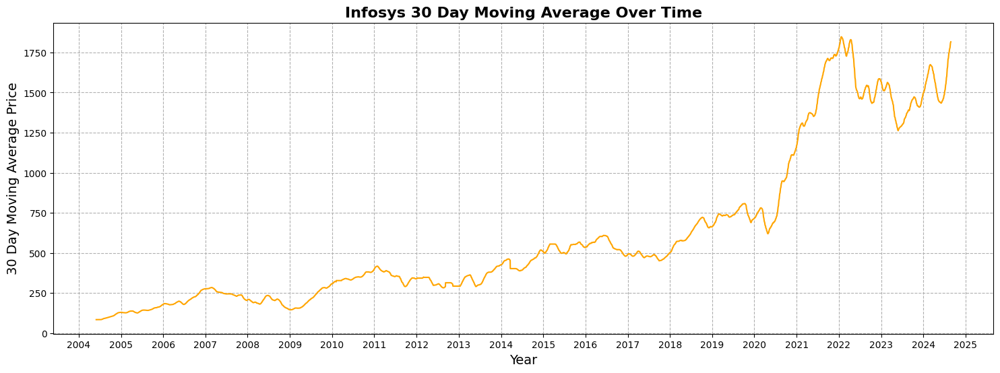

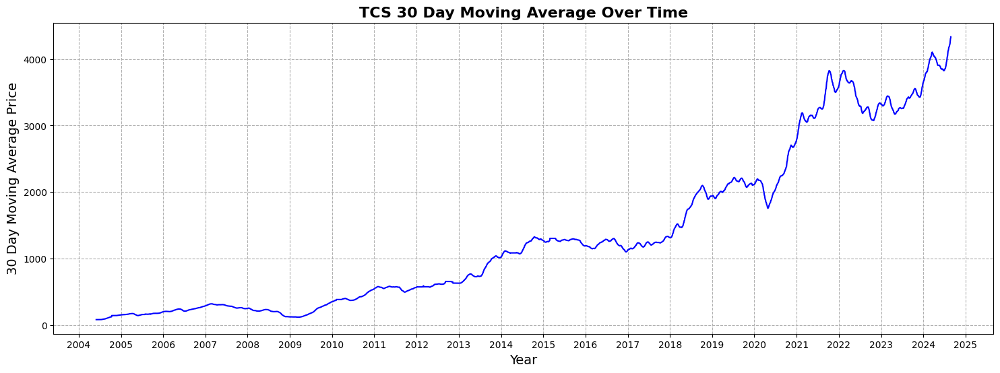

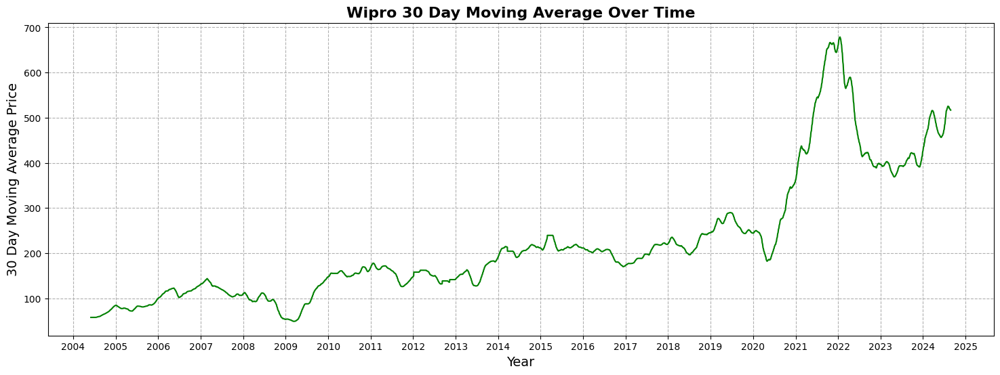

In [44]:
# Graph of 30 Day Moving Average of all 3 companies
close_prices = [['Infy_30-Day MA','orange','Infosys'],['TCS_30-Day MA','blue','TCS'],['Wipro_30-Day MA','green','Wipro']]
for i,j,k in close_prices:
  plt.figure(figsize=(18, 6))
  plt.plot(final_df['Date'],final_df[i],color=j)

  plt.title(f'{k} 30 Day Moving Average Over Time', fontsize=16, fontweight='bold')
  plt.xlabel('Year', fontsize=14)
  plt.ylabel('30 Day Moving Average Price', fontsize=14)

  plt.gca().xaxis.set_major_locator(mdates.YearLocator())
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

  plt.grid(True, which='both', linestyle='--')

### INSIGHTS
A 30-day moving average (MA) is a short-term technical indicator that shows the average movement of a stock's price over the last 30 days  
  
The 30-day moving average smooths out short-term fluctuations and noise, providing a clearer view of the overall trend. This makes it easier to identify whether the stock is going uptrend, downtrend, or moving sideways. When the stock price is above the 30-day MA, it typically indicates a bullish (upward) trend. Conversely, when the price is below the 30-day MA, it suggests a bearish (downward) trend.
  
Though it is a lagging indicator, we can get a sense of the sentiment and infer the trend of the price of stock.  
    
This can be a good indicator for the value of stock as it is seen from the graph that 30 Day MA value is almost similar to the original price of stock i.e. both have similar graphs.
  
They are reactive to price movements, but they don't predict prices. They are a lagging indicator.

### 30-Day MA and Open price

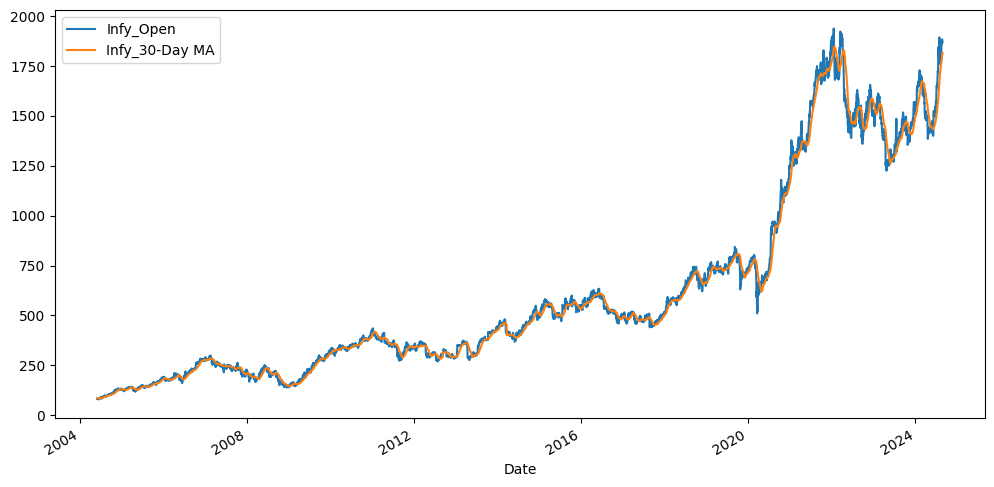

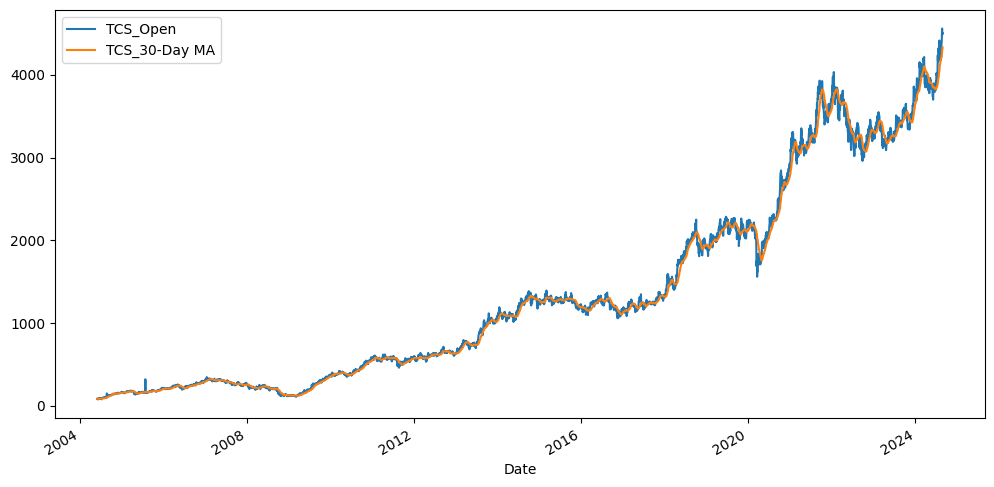

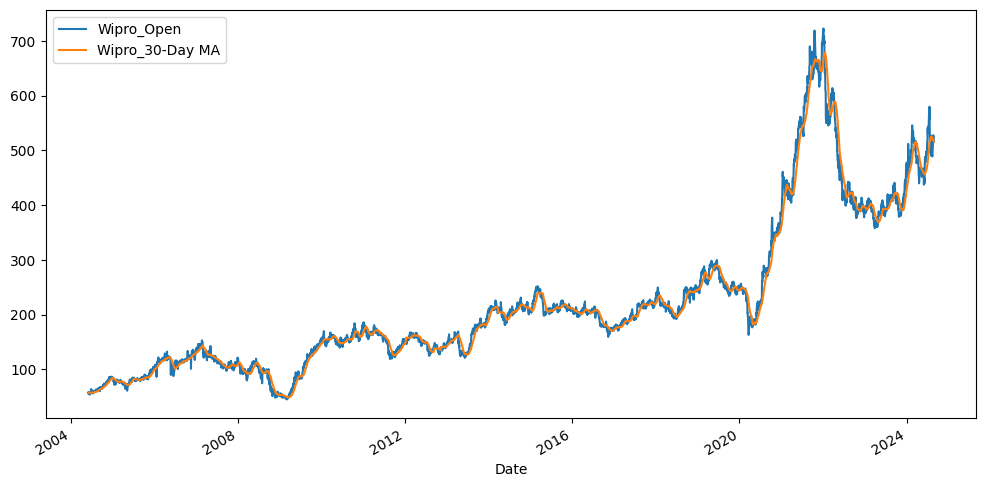

In [45]:
# Line graph of 30 Day MA and Open price
comp_name = [['Date','Infy_Open','Infy_30-Day MA'],
             ['Date','TCS_Open','TCS_30-Day MA'],
             ['Date','Wipro_Open','Wipro_30-Day MA']]

for i in comp_name:
  final_df[i].plot(x='Date', figsize=(12,6))
  plt.show()

### INSIGHT

This graph typically provides insights into trends and momentum in the stock's price movement over time.
  
When the Open price crosses above the 30-Day MA, it might signal a potential upward momentum or bullish trend and when the Open price crosses below the 30-Day MA, it could indicate downward momentum or a bearish trend.
  
Large gaps between the Open price and the 30-Day MA can signal higher volatility. If the Open price moves close to the MA, it suggests the price is stabilizing.

The larger the interval is(i.e. 30 days,60 days, 100 days) the more time it takes for this indicator to understand the trend and usually large gaps between the Open price and the 30-Day MA can signal higher volatility.

### Volume traded of all 3 companies.

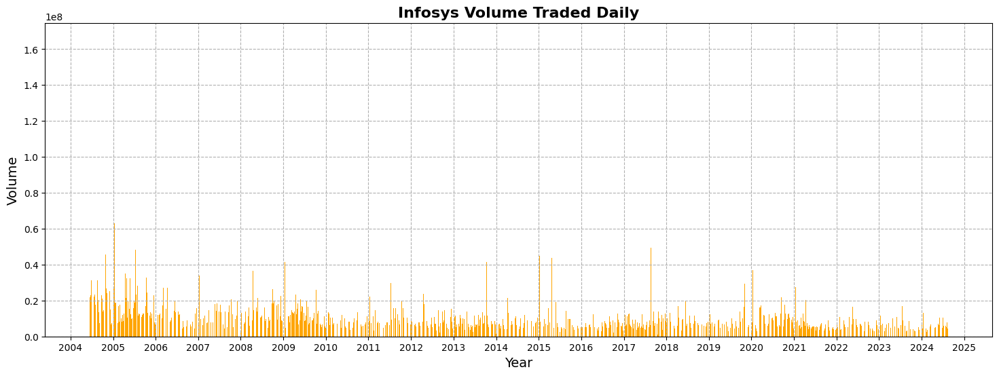

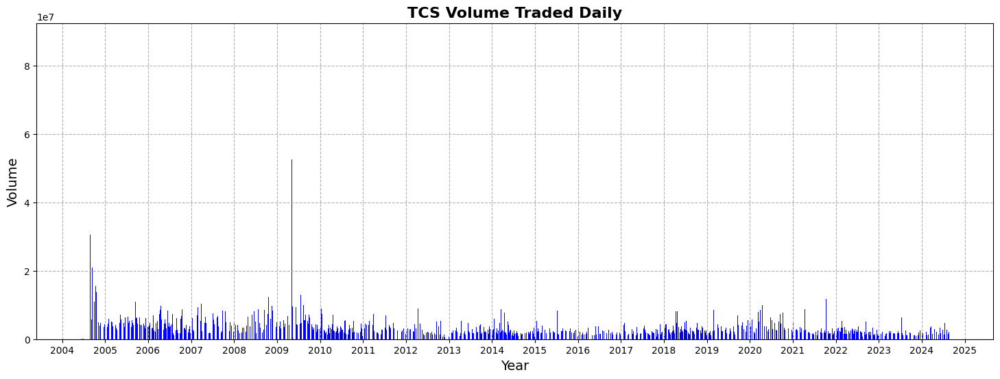

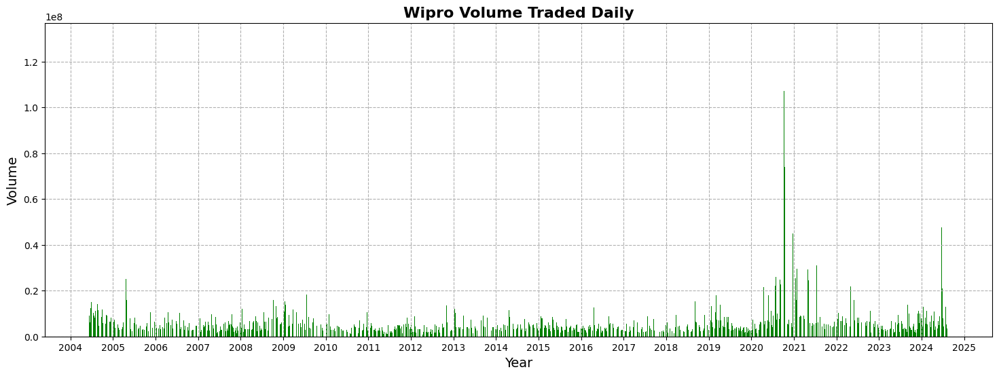

In [46]:
# Graph of Volume traded of all 3 companies over the years
close_prices = [['Infy_Volume','orange','Infosys'],['TCS_Volume','blue','TCS'],['Wipro_Volume','green','Wipro']]

for i,j,k in close_prices:
  plt.figure(figsize=(18, 6))
  plt.bar(final_df['Date'],final_df[i],color=j)

  plt.title(f'{k} Volume Traded Daily', fontsize=16, fontweight='bold')
  plt.xlabel('Year', fontsize=14)
  plt.ylabel('Volume', fontsize=14)

  plt.gca().xaxis.set_major_locator(mdates.YearLocator())
  plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

  plt.grid(True, which='both', linestyle='--')

### INSIGHTS
A high trading volume indicates that a stock is actively traded. This often suggests strong investor interest and can be a sign of confidence in the stock. High volume is typically seen during major news events, earnings reports, or other significant announcements.  
  
Volume is a direct measure of liquidity, which refers to how easily a stock can be bought or sold without affecting its price. Stocks with higher volume are generally more liquid, meaning they can be traded more easily and with less price fluctuation.
  
It can be seen from the graphs that Daily volume traded of all 3 companies lie in almost same range, with rare peaks that may occure due to some announcement or some Macro-economic fator.

### Daily Percentage(%) Change of all 3 companies.



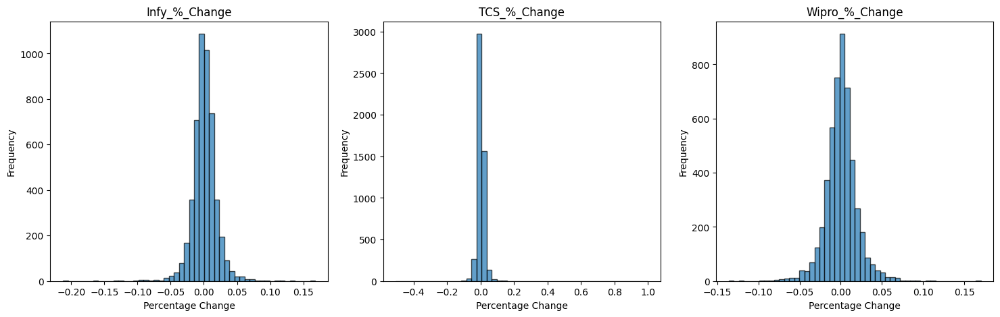

In [47]:
# Histogram of Daily Percentage(%) Change of all 3 companies
Change = ['Infy_%_Change','TCS_%_Change','Wipro_%_Change']

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 5))

for i, ax in enumerate(axes):
    ax.hist(final_df[Change[i]], bins=50, edgecolor='black', alpha=0.7)
    ax.set_title(Change[i])

    ax.set_xlabel('Percentage Change')
    ax.set_ylabel('Frequency')

plt.show()

### INSIGHT
The daily percentage change in a stock's price is the percentage difference between the stock's opening and closing prices for a trading day.
  
The histogram shows whether the daily percentage changes are symmetrically distributed around a central value (here 0). A symmetric distribution with a peak around 0% suggests that most daily changes are small, with equal chances of gains and losses. Also it can be seen that there is almost no Skewness and low Kurtosis(thin tail).  
  
It can be seen that % Change of Infosys,TCS and Wipro is almost symmetric.

### Range of stock price within a day

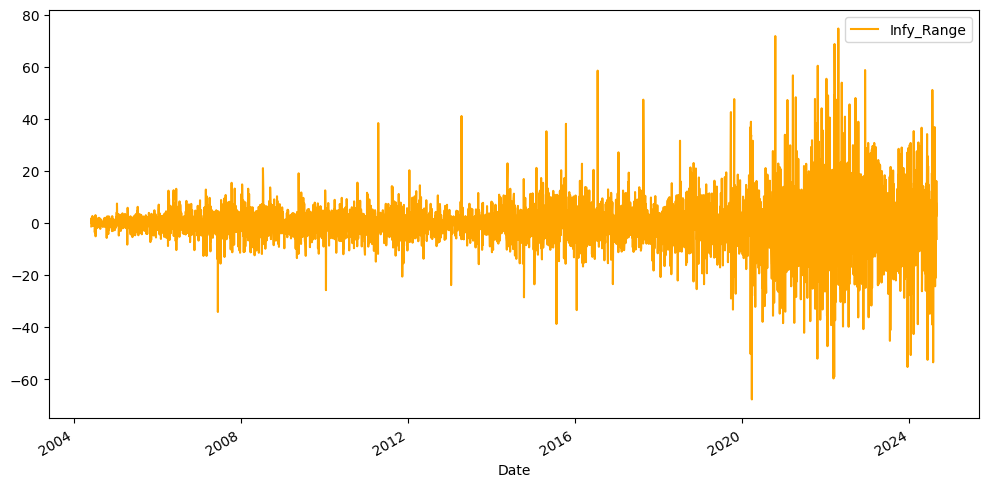

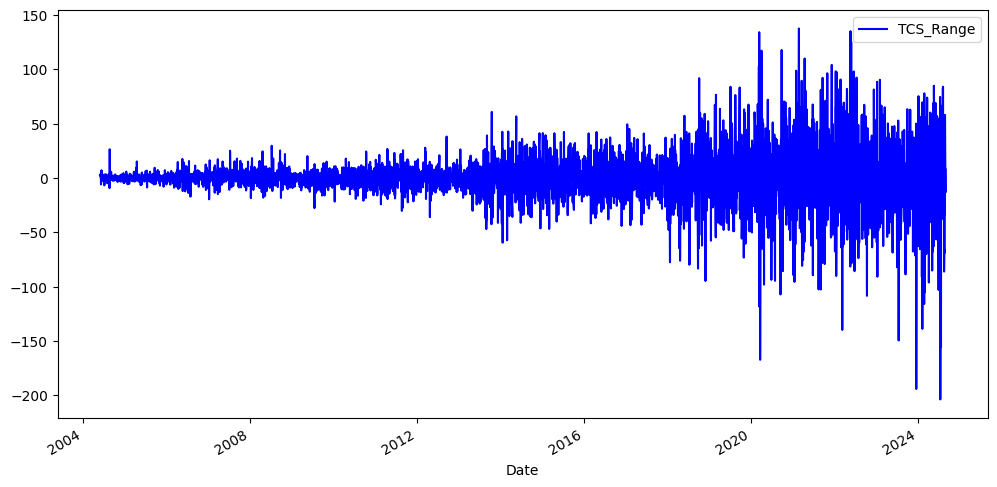

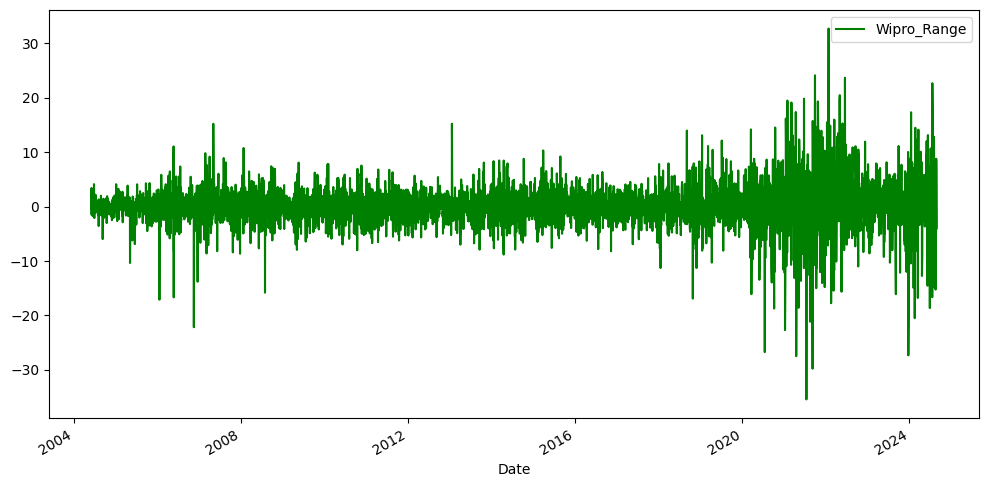

In [48]:
# Daily difference between opening and closing price
import copy

comp_range=[['Infy_Range',['Infy_Open','Infy_Close'],'orange'],
            ['TCS_Range',['TCS_Open','TCS_Close'],'blue'],
            ['Wipro_Range',['Wipro_Open','Wipro_Close'],'green']]

df_temp = pd.DataFrame()
df_temp['Date'] = copy.deepcopy(final_df['Date'])

for i,j,k in comp_range:
  df_temp[i] = final_df[j[0]] - final_df[j[1]]

  df_temp[['Date', i]].plot(x='Date',figsize=(12,6),color = k)
  plt.show()

### INSIGHT

From the plot of range we can infer multiple things like a market sentiment, volatility and trading patterns.
  
Large positive ranges can signal strong buying interest or positive news, Similarly large negative ranges can indicate strong selling pressure or negative sentiment.
  
Larger ranges (whether positive or negative) indicate higher intraday volatility, meaning the stock experienced significant price swings within the trading session(day), Similarly smaller ranges suggest low volatility, meaning the stock price remained relatively stable throughout the day.
  
Consistently large positive ranges could indicate a sustained uptrend Similarly, consistently large negative ranges may suggest a downtrend.


### Bollinger Bands

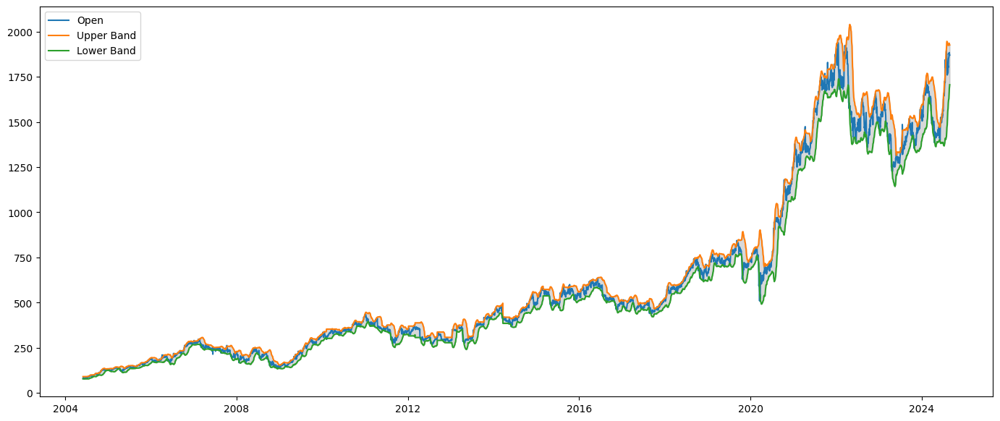

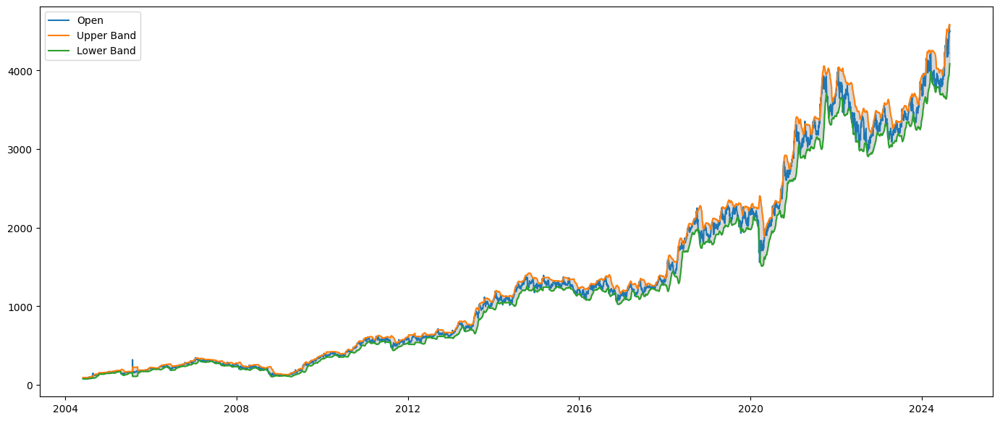

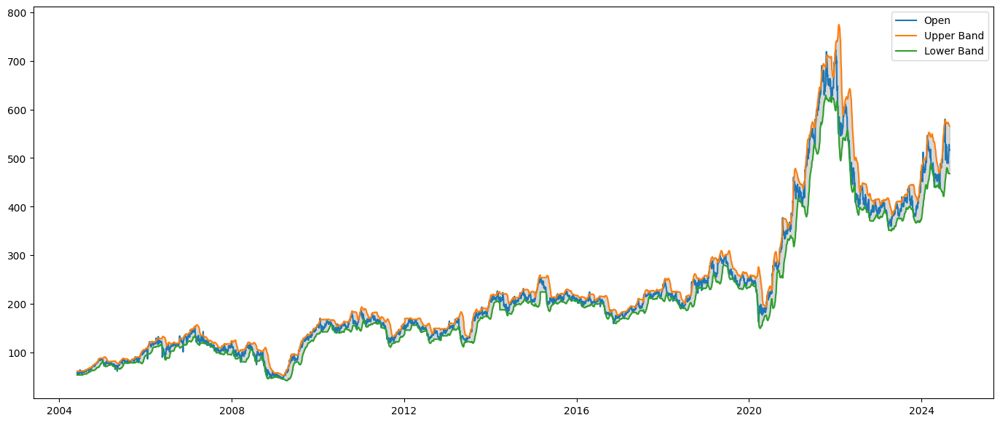

In [49]:
# Bollinger Bands for all 3 companies.
Bol_Band = [['Infy_Open','Infy_Upper Band','Infy_Lower Band'],
            ['TCS_Open','TCS_Upper Band','TCS_Lower Band'],
            ['Wipro_Open','Wipro_Upper Band','Wipro_Lower Band']]

for i in Bol_Band:
  plt.figure(figsize=(17,7))
  plt.plot(final_df['Date'], final_df[i[0]], label='Open')
  plt.plot(final_df['Date'], final_df[i[1]], label='Upper Band')
  plt.plot(final_df['Date'], final_df[i[2]], label='Lower Band')
  plt.fill_between(final_df['Date'], final_df[i[1]], final_df[i[2]], color='gray', alpha=0.3)
  plt.legend()
  plt.show()

### INSIGHT

Bollinger Bands consist of the moving average (Rolling Mean) and two bands (Upper and Lower) that are placed at ±2 standard deviations away from this moving average.
  
This helps us in decideing whether a stock is more than or less than it's mean ±2 standard deviation (i.e.expensive or a bargain), the stock price is to be considered relatively low if it is near the lower band and relatively high if it is near the upper band.
  
They are reactive to price movements, but they don't predict prices. They are a lagging indicator.


### Scatter plot between attributes for all companies.

Scatter plot of all columns for Infosys


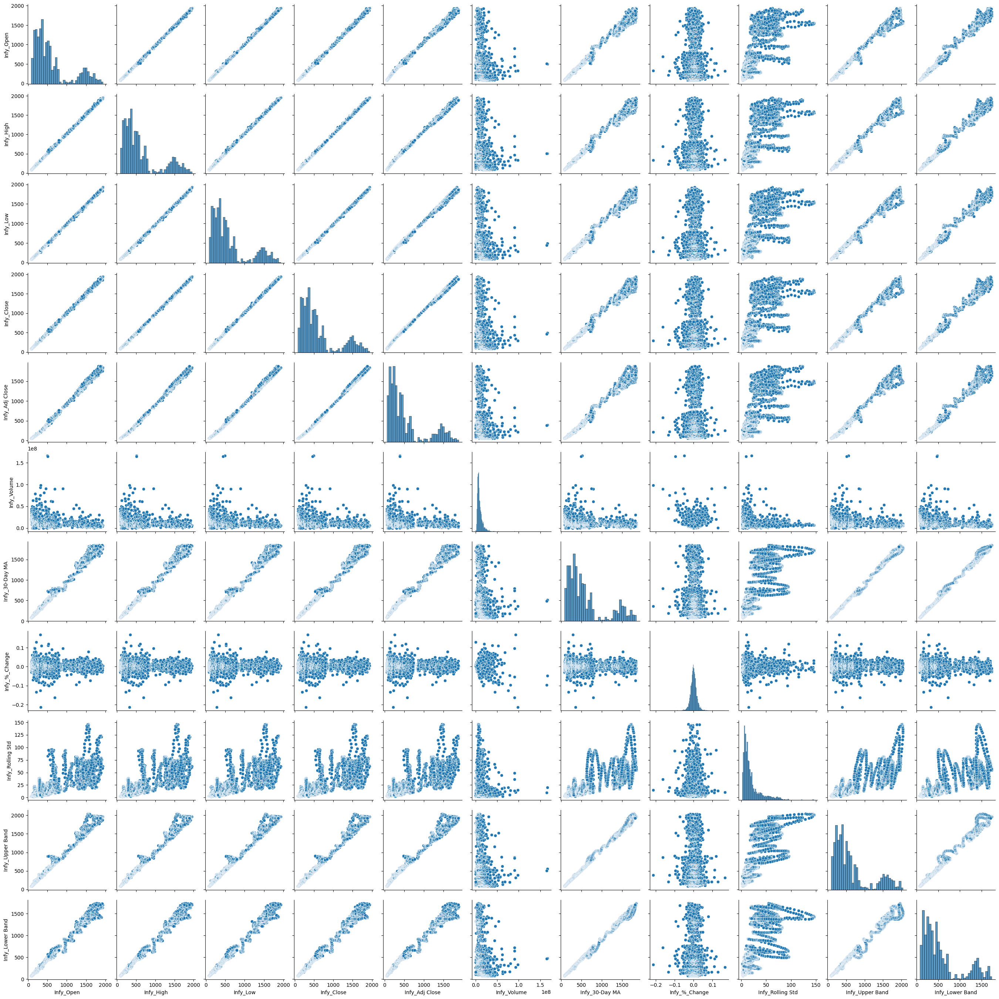

Scatter plot of all columns for TCS


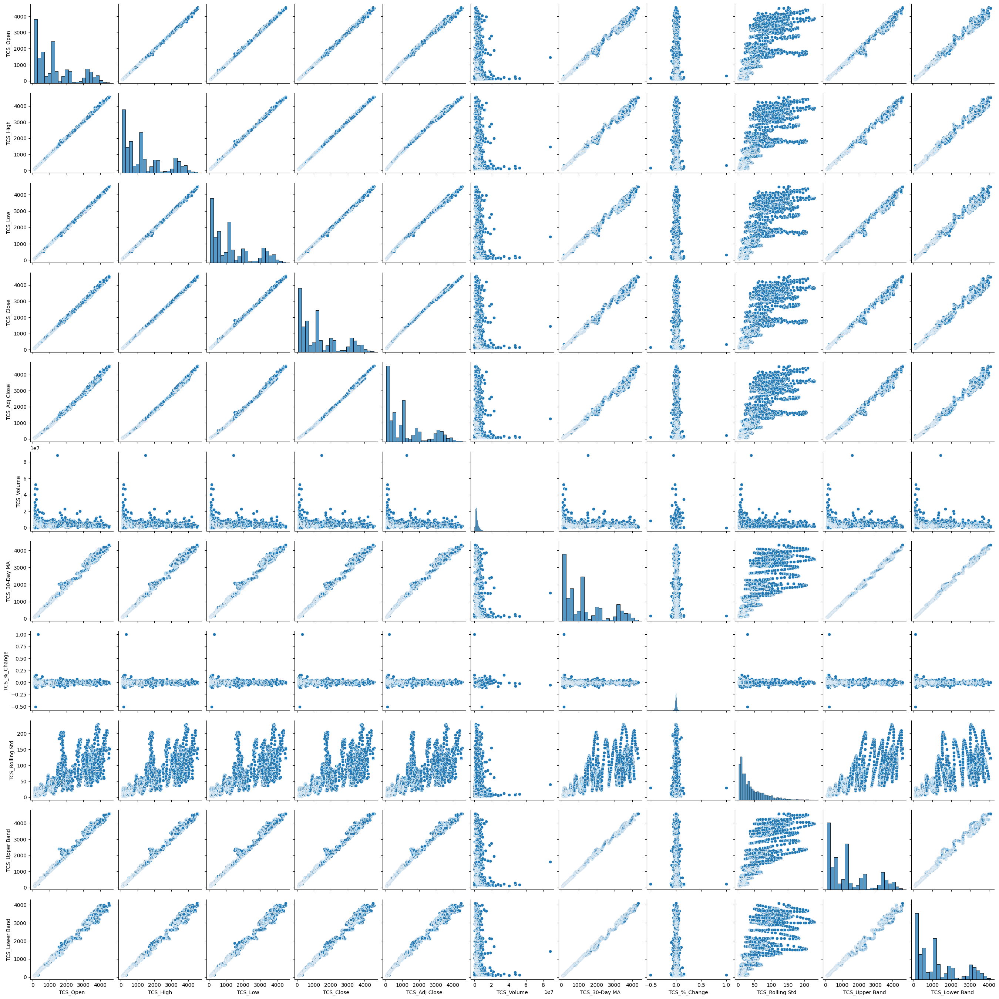

Scatter plot of all columns for Wipro


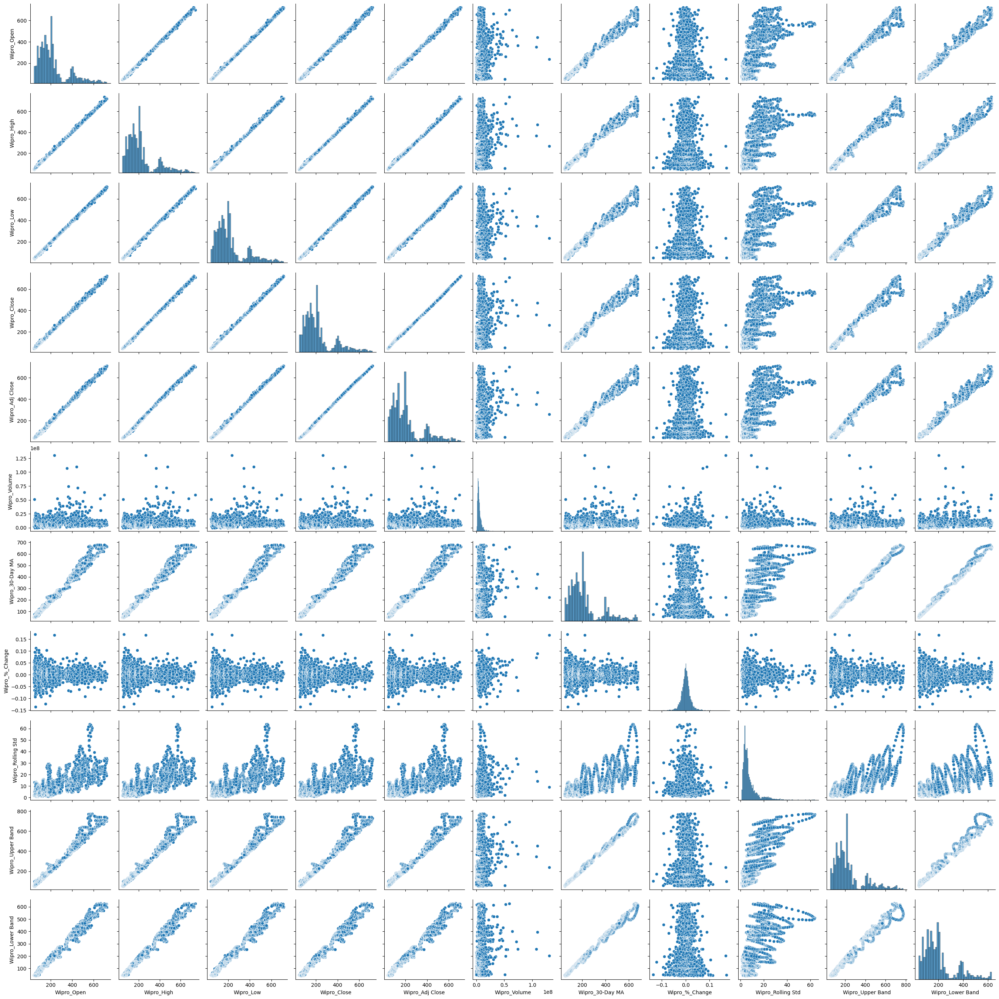

In [50]:
comp_cols = [[['Infy_Open', 'Infy_High', 'Infy_Low', 'Infy_Close', 'Infy_Adj Close','Infy_Volume', 'Infy_30-Day MA', 'Infy_%_Change','Infy_Rolling Std','Infy_Upper Band','Infy_Lower Band'],'Infosys'],
             [['TCS_Open', 'TCS_High', 'TCS_Low', 'TCS_Close', 'TCS_Adj Close','TCS_Volume', 'TCS_30-Day MA', 'TCS_%_Change','TCS_Rolling Std','TCS_Upper Band','TCS_Lower Band'],'TCS'],
             [['Wipro_Open', 'Wipro_High', 'Wipro_Low', 'Wipro_Close', 'Wipro_Adj Close','Wipro_Volume', 'Wipro_30-Day MA', 'Wipro_%_Change','Wipro_Rolling Std','Wipro_Upper Band','Wipro_Lower Band'],'Wipro']]

for i,j in comp_cols:
  sns.pairplot(final_df[i])
  print(f'Scatter plot of all columns for {j}')
  plt.show()

### INSIGHTS

Scatter plot can be used to find any type of association between the attributes.
  
Here we can observe that attributes like Open, Close, High, Low, 30-Day MA are highly correlated(linearly associated) i.e. the change in value of one diectly affects the value of other in the same way.
  
While attributes like Upper Band, Lower band, Rolling Std, %_change are not that strongly correlated with others and attributes like Volume have almost no correlation, From scatter plot we can obtain the directioon of correlation(to be precise association) but to get a value so understand how strongly they are correlated we use correlation matrix.

### correlation matrix for all 3 companies.

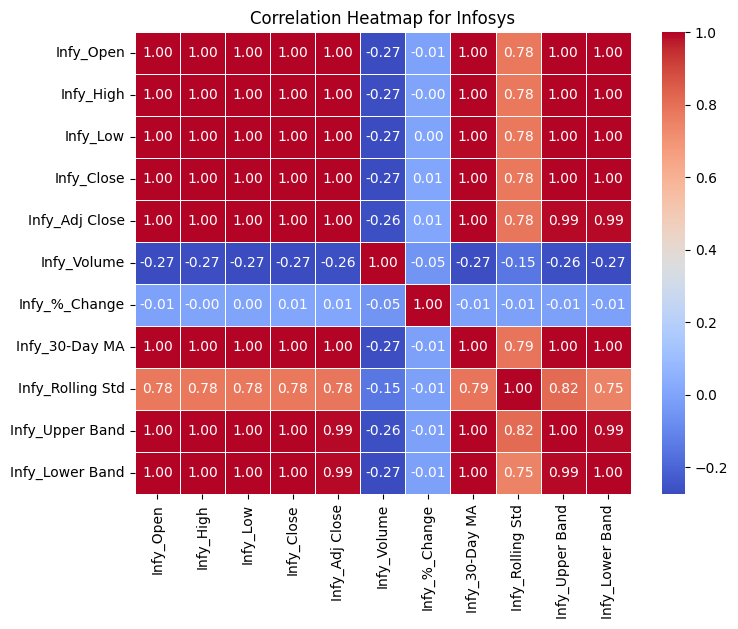

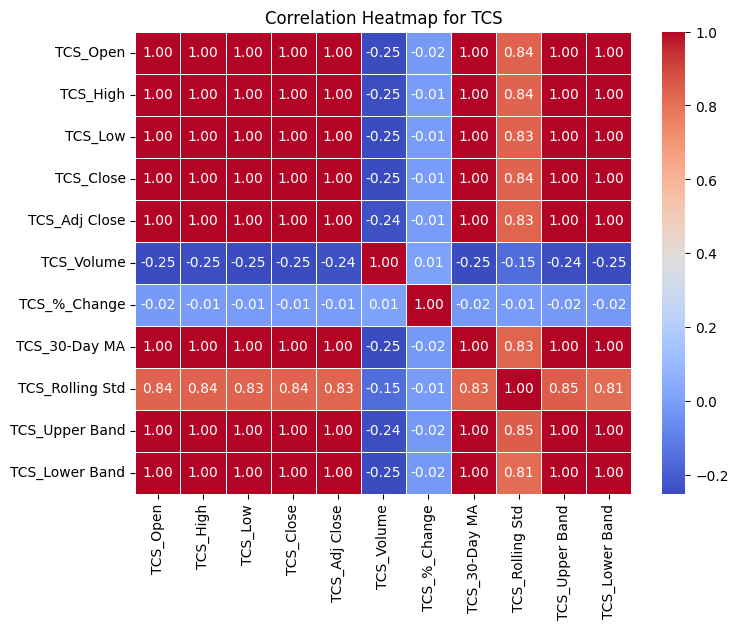

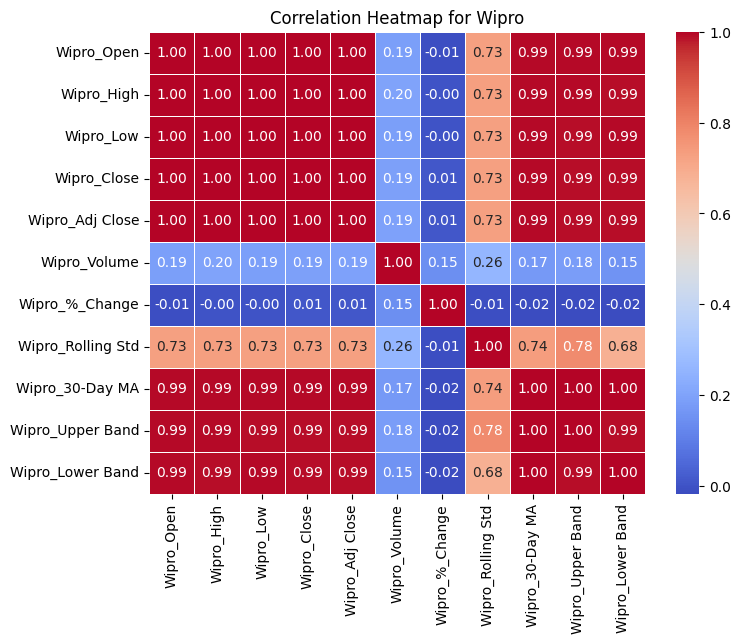

In [51]:
cor_mat = [[['Infy_Open', 'Infy_High', 'Infy_Low', 'Infy_Close', 'Infy_Adj Close', 'Infy_Volume', 'Infy_%_Change', 'Infy_30-Day MA', 'Infy_Rolling Std','Infy_Upper Band','Infy_Lower Band'], 'Infosys'],
           [['TCS_Open', 'TCS_High', 'TCS_Low', 'TCS_Close', 'TCS_Adj Close', 'TCS_Volume', 'TCS_%_Change', 'TCS_30-Day MA', 'TCS_Rolling Std','TCS_Upper Band','TCS_Lower Band'], 'TCS'],
           [['Wipro_Open', 'Wipro_High', 'Wipro_Low', 'Wipro_Close', 'Wipro_Adj Close', 'Wipro_Volume', 'Wipro_%_Change', 'Wipro_Rolling Std', 'Wipro_30-Day MA','Wipro_Upper Band','Wipro_Lower Band'], 'Wipro']]

for i, j in cor_mat:
  plt.figure(figsize=(8,6))
  sns.heatmap(final_df.loc[:, i].corr(), annot=True, cmap='coolwarm',fmt='.2f', linewidth=0.5)
  plt.title(f'Correlation Heatmap for {j}')
  plt.show()

### INSIGHT
This table shows the strength and direction of the relationship between variables in our data frame for each company seperately.
  
As we can infer from the correlation matrix that most of the attributes have large correlation that is because for most of the days the opening, closing, high, low price of a stock is very close to each other and an be linearly approximated so until any external factors like Change in goverment policy or the reliase of the finincial statements of the company were not as great as expectecd or due to any Macro-Economic reasons.

# Data Split & Model Training

---



In [3]:
# Load Data
path = r"C:\Users\Viraj\DA-IICT\Sem-1\FML\Assignments\Regression\final_df.csv"
df = pd.read_csv(path)
source_path = os.path.basename(path)

In [4]:
# Convert the Date column to datetime format and sort the data
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')
df = df.sort_values('Date')

In [5]:
# Define features and target
features = ['TCS_High', 'TCS_Low',"TCS_Volume","TCS_30-Day MA","TCS_%_Change","TCS_Close"]
df['Prediction'] = df['TCS_Open'].shift(-1)
df = df.dropna()
X = df[features]
y = df['Prediction']

In [6]:
# Split the data into training+validation and test sets without shuffling
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

In [7]:
# Use TimeSeriesSplit for cross-validation
tscv = TimeSeriesSplit(n_splits=5)

In [8]:
# Creating a pipeline
pipelines = {
    'rf':make_pipeline(RandomForestRegressor(random_state=42)),
    'gb':make_pipeline(GradientBoostingRegressor(random_state=42)),
    'ridge':make_pipeline(Ridge(random_state=42)),
    'lasso':make_pipeline(Lasso(random_state=42)),
    'lr':make_pipeline(LinearRegression()),
    'enet':make_pipeline(ElasticNet(random_state=42))
}

In [9]:
# Providing possible values of Hyperparameter
hyperparameters = {
    'rf': {
        'randomforestregressor__min_samples_split':[2,4,6],
        'randomforestregressor__min_samples_leaf':[1,2,3]
    },
    'gb':{
        'gradientboostingregressor__alpha':[0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 0.99]
    },
    'ridge':{
        'ridge__alpha':[0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]
    },
    'lasso':{
        'lasso__alpha':[0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1]
    },
    'lr': {},
    'enet':{
        'elasticnet__alpha':[0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 0.99]
    }
}

In [10]:
models_fit = {}
for algo, pipeline in pipelines.items():
    model = GridSearchCV(pipeline, hyperparameters[algo], cv=tscv, n_jobs=-1)
    try:
        print('Starting training for {}.'.format(algo))
        model.fit(X_train, y_train)
        models_fit[algo] = model
        print('{} has been successfully fit.'.format(algo))
    except NotFittedError as e:
        print(repr(e))

Starting training for rf.
rf has been successfully fit.
Starting training for gb.
gb has been successfully fit.
Starting training for ridge.


c:\Users\Viraj\miniconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18171e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
c:\Users\Viraj\miniconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.907e+05, tolerance: 1.630e+05
  model = cd_fast.enet_coordinate_descent(


ridge has been successfully fit.
Starting training for lasso.
lasso has been successfully fit.
Starting training for lr.
lr has been successfully fit.
Starting training for enet.
enet has been successfully fit.


c:\Users\Viraj\miniconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.903e+05, tolerance: 1.630e+05
  model = cd_fast.enet_coordinate_descent(



Evaluating rf
Training set errors for rf - R2: 0.999948673591257, MAE: 2.2793777989643806, MSE: 20.88414621804604, RMSE: 4.5699175285825495
Validation set (cross-validation) mean R2 score for rf: -1.5348449386028826
Test set errors for rf - R2: -7.0467500636172264, MAE: 1106.9024541475683, MSE: 1397214.1305231156, RMSE: 1182.038125663938


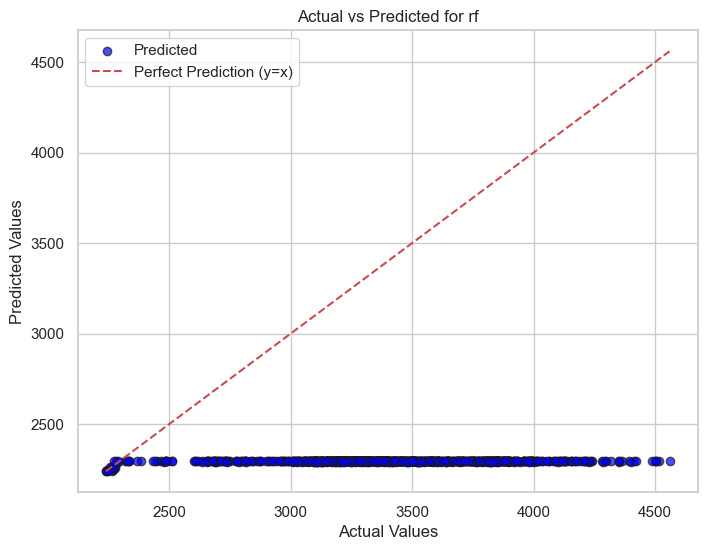


Evaluating gb
Training set errors for gb - R2: 0.9998690072065103, MAE: 4.4575483369804205, MSE: 53.299514221772604, RMSE: 7.300651629941851
Validation set (cross-validation) mean R2 score for gb: -1.8384650278346153
Test set errors for gb - R2: -7.063864352481689, MAE: 1108.2000339763242, MSE: 1400185.805552939, RMSE: 1183.2944711917398


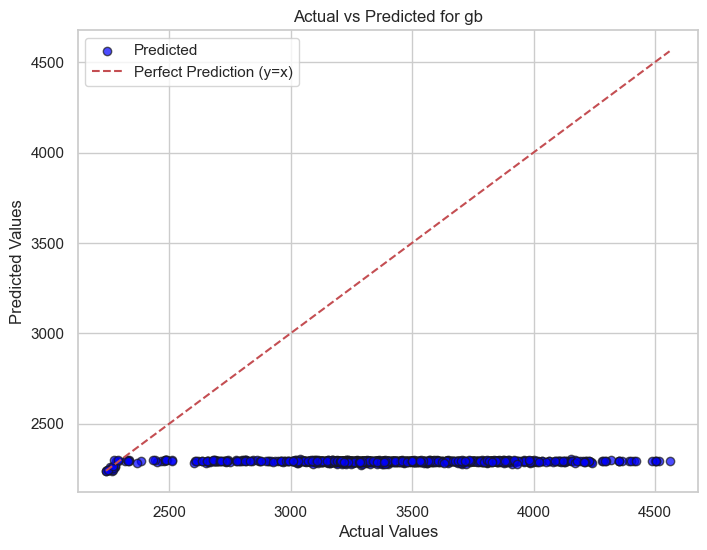


Evaluating ridge
Training set errors for ridge - R2: 0.9997990718238445, MAE: 4.3185006499802014, MSE: 81.75544545050481, RMSE: 9.041871789099025
Validation set (cross-validation) mean R2 score for ridge: 0.9943011715585346
Test set errors for ridge - R2: 0.9968997764275224, MAE: 16.283509130814352, MSE: 538.3137476621756, RMSE: 23.20158933483169


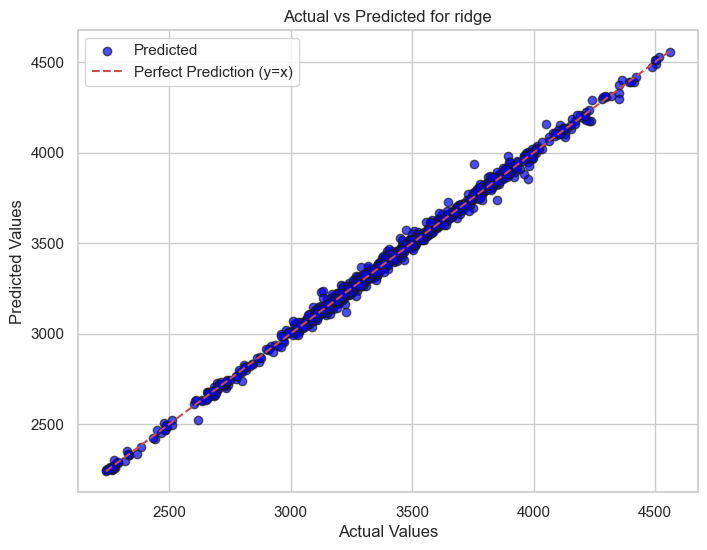


Evaluating lasso
Training set errors for lasso - R2: 0.9996443584101125, MAE: 6.423872444001012, MSE: 144.70661685337228, RMSE: 12.029406338359856
Validation set (cross-validation) mean R2 score for lasso: 0.991104350482399
Test set errors for lasso - R2: 0.994539255644938, MAE: 23.050148398935573, MSE: 948.1876677846258, RMSE: 30.792656069014665


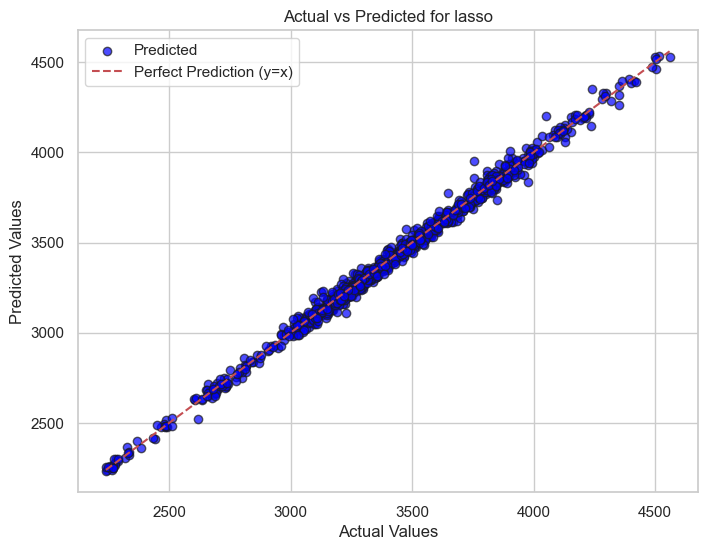


Evaluating lr
Training set errors for lr - R2: 0.9997992129822206, MAE: 4.359340531414965, MSE: 81.69800967351536, RMSE: 9.03869513113012
Validation set (cross-validation) mean R2 score for lr: 0.9942914992687983
Test set errors for lr - R2: 0.9969049738036558, MAE: 16.268907044573332, MSE: 537.4112904815744, RMSE: 23.18213300111908


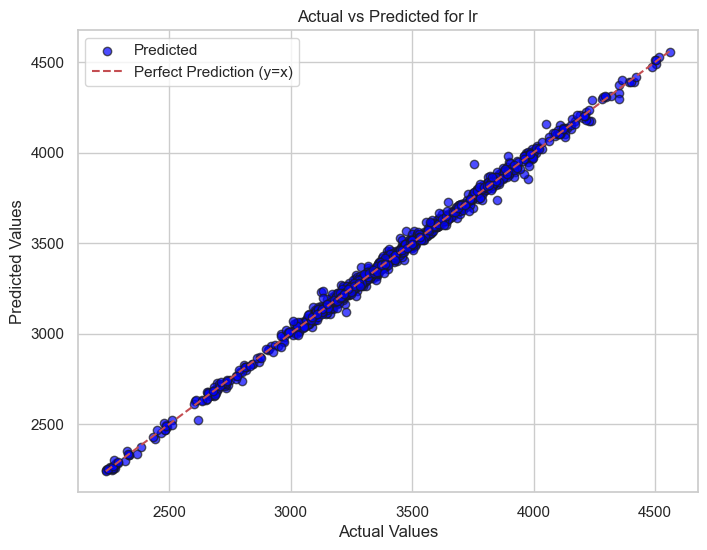


Evaluating enet
Training set errors for enet - R2: 0.9996449096577349, MAE: 6.499907837566914, MSE: 144.48232031228486, RMSE: 12.020079879613315
Validation set (cross-validation) mean R2 score for enet: 0.9908839903160364
Test set errors for enet - R2: 0.9945223689380049, MAE: 23.090742242232988, MSE: 951.1198261539458, RMSE: 30.840230643656767


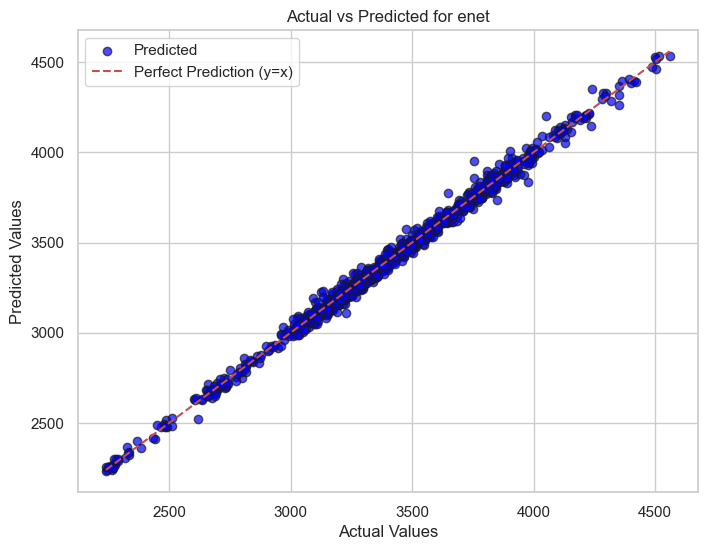

In [11]:
# Loop through and evaluate models performance on train, validation, and test sets

sns.set(style='whitegrid')
for algo, model in models_fit.items():
    print(f'\nEvaluating {algo}')

    # Training set evaluation
    yhat_train = model.predict(X_train)
    print(f'Training set errors for {algo} - R2: {r2_score(y_train, yhat_train)}, '
          f'MAE: {mean_absolute_error(y_train, yhat_train)}, '
          f'MSE: {mean_squared_error(y_train, yhat_train)}, '
          f'RMSE: {np.sqrt(mean_squared_error(y_train, yhat_train))}')

    # Validation set evaluation (average across all splits)
    mean_val_score = np.mean(model.cv_results_['mean_test_score'])
    print(f'Validation set (cross-validation) mean R2 score for {algo}: {mean_val_score}')

    # Test set evaluation
    yhat_test = model.predict(X_test)
    print(f'Test set errors for {algo} - R2: {r2_score(y_test, yhat_test)}, '
          f'MAE: {mean_absolute_error(y_test, yhat_test)}, '
          f'MSE: {mean_squared_error(y_test, yhat_test)}, '
          f'RMSE: {np.sqrt(mean_squared_error(y_test, yhat_test))}')
    
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, yhat_test, color='blue', edgecolor='k', alpha=0.7, label='Predicted')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', label='Perfect Prediction (y=x)')

    plt.title(f'Actual vs Predicted for {algo}')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.legend()

    plt.show()

In [13]:
best_model = models_fit['ridge']
X_next_day = np.array([df[features].iloc[-1]])
next_day_prediction = best_model.predict(X_next_day)
print("The original opening price on 27th August was 4505\n and our model predicted below value\n")
print(f"Predicted TCS_Open value for the next day: {next_day_prediction[0]}")

The original opening price on 27th August was 4505
 and our model predicted below value

Predicted TCS_Open value for the next day: 4509.205325046321


c:\Users\Viraj\miniconda3\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but Ridge was fitted with feature names
  warnings.warn(


# Documentation  
  
### Data Preparation and Processing

**Loading Data:**

1. Read stock data from CSV files scrapped from [Yahoo Finance](https://finance.yahoo.com/) into separate DataFrames for Infosys, TCS, and Wipro.


**Feature Engineering:**

1. Infosys:
 - Calculate the 30-day moving average, daily percentage change for closing prices, upper band & lower band. 
 - Rename columns to distinguish them.

2. TCS and Wipro:
 - Similar processing as Infosys with column renaming.

**Data Merging:**

1. Combine DataFrames for Infosys, TCS, and Wipro into a single DataFrame.
2. Remove duplicate columns and handle missing values using forward-fill.
3. Convert the 'Date' column to datetime format and adjust data types for memory efficiency.

**Visualization:**

**1. Adjusted Close Prices:**
 - Plot time series for each company and combine them.

**2. Cumulative Percentage Gain:**
 - Plot percentage gain for each company over time.

**3. 30-Day Moving Average:**
 - Plot moving averages for all three companies.

**4. Volume Traded:**
 - Bar charts showing daily trading volume.

**5. Daily Percentage Change:**
 - Histograms for percentage changes.

**6. Correlation Heatmap:**
 - Show correlations between features.

### Model Training

**Data Preparation for Modeling:**

1. Load the cleaned data and sort by date.
2. Define features and target variable; shift the 'TCS_Open' for prediction.
3. Split data into training validation and test sets.

**Model Training and Validation:**

1. Use TimeSeriesSplit for cross-validation.
2. Train and validate models using Ridge, Lasso, and Linear Regression.
3. Select the best model based on Mean Squared Error (MSE).

**Model Evaluation:**

1. Evaluate the best model on the test set using MSE, Root Mean Squared Error (RMSE), Mean Absolute Error (MAE), R-squared, and Explained Variance Score.
2. Plot actual vs. predicted prices on the test set.

**Model Persistence:**

This documentation covers data processing, visualization, and model training steps, providing a comprehensive overview of the analysis and predictive modeling workflow.